In [3]:
#import all the necessary packages.
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [4]:
# we have give a json file which consists of all information about
# the products
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')


In [5]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


### Terminology:
What is a dataset? <br>
Rows and columns <br>
Data-point <br>
Feature/variable <br>







In [6]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [7]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [8]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


####  Basic stats for the feature: product_type_name

In [9]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].value_counts())

# 91.62% (167794/183138) of the products are shirts,


SHIRT                   167794
APPAREL                   3549
BOOKS_1973_AND_LATER      3336
DRESS                     1584
SPORTING_GOODS            1281
                         ...  
CONSUMER_ELECTRONICS         1
ABIS_SPORTS                  1
VIDEO_DVD                    1
COMPUTER_COMPONENT           1
GOLF_CLUB                    1
Name: product_type_name, Length: 72, dtype: int64


In [10]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

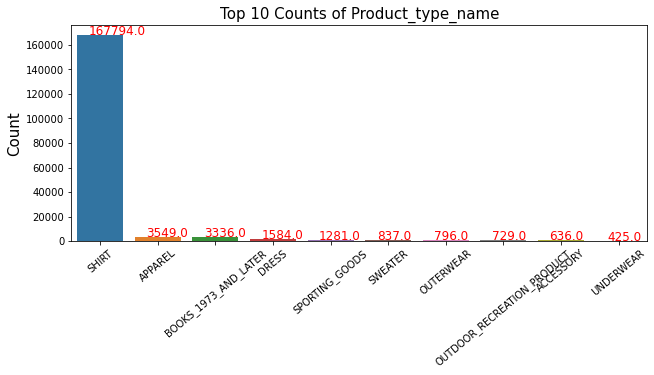

In [11]:
## top 10 most used frequent products,
fig = plt.figure(figsize = (8, 3))
ax = fig.add_axes([0,0,1,1])
ax.set_title('Top 10 Counts of Product_type_name', fontsize = 15)
top10_counts =  pd.DataFrame(data['product_type_name'].value_counts()).reset_index()[:10]
sns.barplot(x=top10_counts['index'],y=top10_counts['product_type_name'])
for i in ax.patches:
    ax.text(x = i.get_x() + 0.2, y = i.get_height()+10, s = str(i.get_height()), fontsize = 12, color = 'red')
plt.xlabel('')
plt.xticks(rotation=40)
plt.ylabel('Count', fontsize = 15)
plt.show()

####  Basic stats for the feature: brand

In [12]:
# We have total 72 unique type of product_type_names
print(data['brand'].value_counts())

# 91.62% (167794/183138) of the products are shirts,


Zago                         223
XQS                          222
Yayun                        215
YUNY                         198
XiaoTianXin-women clothes    193
                            ... 
Fornia Apparel                 1
Holysong                       1
FITS                           1
Lady Hathaway                  1
DAMEE                          1
Name: brand, Length: 10577, dtype: int64


In [13]:
# names of different product types
print(data['brand'].unique())

['FNC7C' 'FIG Clothing' 'Focal18' ... 'Z' "Rain's Pan Jacket"
 'FFLMYUHULIU']


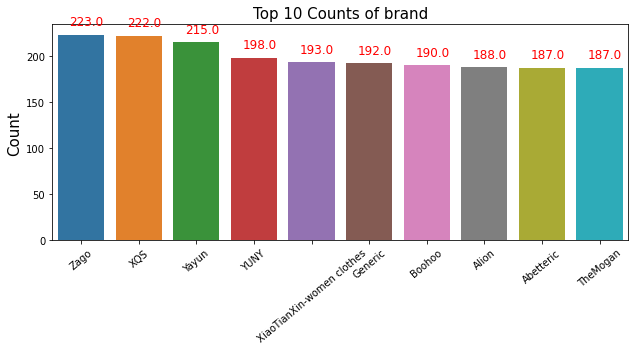

In [14]:
## top 10 most used frequent products,
fig = plt.figure(figsize = (8, 3))
ax = fig.add_axes([0,0,1,1])
ax.set_title('Top 10 Counts of brand', fontsize = 15)
top10_counts =  pd.DataFrame(data['brand'].value_counts()).reset_index()[:10]
sns.barplot(x=top10_counts['index'],y=top10_counts['brand'])
for i in ax.patches:
    ax.text(x = i.get_x() + 0.2, y = i.get_height()+10, s = str(i.get_height()), fontsize = 12, color = 'red')
plt.xlabel('')
plt.xticks(rotation=40)
plt.ylabel('Count', fontsize = 15)
plt.show()

####  Basic stats for the feature: color

In [15]:
# We have total 72 unique type of product_type_names
print(data['color'].value_counts())

# 91.62% (167794/183138) of the products are shirts,


Black                 13207
White                  8616
Blue                   3570
Red                    2289
Pink                   1842
                      ...  
Football on Red           1
Orchid Gingham            1
Peony/White/Black         1
Ple Apr                   1
Retro Heather Navy        1
Name: color, Length: 7380, dtype: int64


In [16]:
# names of different product types
print(data['color'].unique())

[None 'Onyx Black/ Stone' 'Grape' ... 'Combo C'
 'White, Soft Coral and Charcoal Varigated' 'Monochrome Plaid']


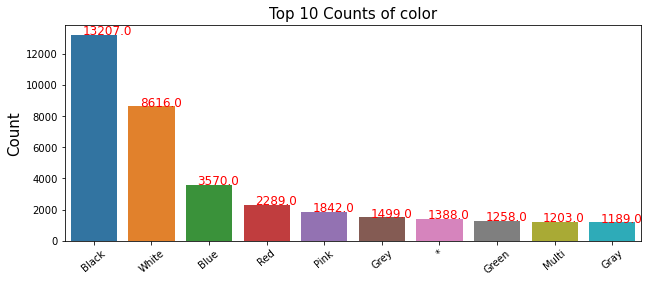

In [17]:
## top 10 most used frequent products,
fig = plt.figure(figsize = (8, 3))
ax = fig.add_axes([0,0,1,1])
ax.set_title('Top 10 Counts of color', fontsize = 15)
top10_counts =  pd.DataFrame(data['color'].value_counts()).reset_index()[:10]
sns.barplot(x=top10_counts['index'],y=top10_counts['color'])
for i in ax.patches:
    ax.text(x = i.get_x() + 0.2, y = i.get_height()+10, s = str(i.get_height()), fontsize = 12, color = 'red')
plt.xlabel('')
plt.xticks(rotation=40)
plt.ylabel('Count', fontsize = 15)
plt.show()

####  Basic stats for the feature: formatted_price

In [18]:
# We have total 72 unique type of product_type_names
print(data['formatted_price'].value_counts())

# 91.62% (167794/183138) of the products are shirts,


$19.99     945
$9.99      749
$9.50      601
$14.99     472
$7.50      463
          ... 
$22.34       1
$129.97      1
$35.28       1
$100.77      1
$61.48       1
Name: formatted_price, Length: 3135, dtype: int64


In [19]:
# names of different product types
print(data['formatted_price'].unique())

[None '$26.26' '$9.99' ... '$16.05' '$88.29' '$28.05']


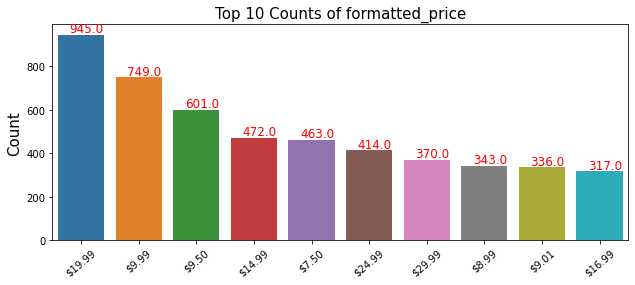

In [20]:
## top 10 most used frequent products,
fig = plt.figure(figsize = (8, 3))
ax = fig.add_axes([0,0,1,1])
ax.set_title('Top 10 Counts of formatted_price', fontsize = 15)
top10_counts =  pd.DataFrame(data['formatted_price'].value_counts()).reset_index()[:10]
sns.barplot(x=top10_counts['index'],y=top10_counts['formatted_price'])
for i in ax.patches:
    ax.text(x = i.get_x() + 0.2, y = i.get_height()+10, s = str(i.get_height()), fontsize = 12, color = 'red')
plt.xlabel('')
plt.xticks(rotation=40)
plt.ylabel('Count', fontsize = 15)
plt.show()

#### Imputing missing values
    * let's consider data points without null values in price and color

In [21]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null  
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [22]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


#### We brought down the number of data points from 183K  to 28K.

We are processing only 28K points so that most of the workshop participants can run this code on thier laptops in a reasonable amount of time. <br> 

For those of you who have powerful computers and some time to spare, you are recommended to use all of the 183K images.


In [21]:
data.to_pickle('pickels/28k_apparel_data')

In [23]:
from PIL import Image
import requests
from io import BytesIO
i = 0
# for index, row in images.iterrows():
#     try:
#         url = row['large_image_url']
#         response = requests.get(url)
#         img = Image.open(BytesIO(response.content))
#         img.save('images/28k_images/'+row['asin']+'.jpeg')
#         i+=1
#     except:
#         print('Unidentified image error: ',i)
#         i+=1

#### [5.2] Remove near duplicate items

#### [5.2.1] Understand about duplicates.

In [23]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))

# we have 2325 products which have same title but different color

2325


#### These shirts are exactly same except in size (S, M,L,XL)

<table>
<tr> 
<td><img src="dedupe/B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="dedupe/B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="dedupe/B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="dedupe/B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

#### These shirts exactly same except  in color

<table>
<tr> 
<td><img src="dedupe/B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="dedupe/B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="dedupe/B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="dedupe/B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


#### [5.2.2] Remove duplicates : Part 1

In [24]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

In [25]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [26]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [27]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [46]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [42]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])


            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [43]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [44]:
print('Number of data points : ', data.shape[0])

Number of data points :  17592


In [45]:
data.to_pickle('pickels/17k_apperal_data')

#### let's remove duplicates part  - 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [51]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []

while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [52]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [53]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16434


In [54]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [24]:
data = pd.read_pickle('pickels/16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

In [25]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'no', 'y', "shouldn't", 'are', 'down', 'and', 'herself', 'now', 'yourself', 'this', "don't", 'she', 'at', 'can', 'do', 'mustn', 'ain', 'after', 'needn', 'through', 'some', 'haven', 'hasn', "that'll", 'until', 'itself', "you'd", 'only', "you've", 'ours', 'on', 'he', 'where', 'an', 'ourselves', 'was', 's', 'during', 'while', 'should', 'why', 'if', 'when', 'doesn', 'there', 'myself', 'again', 'isn', 'himself', 'below', "you'll", "needn't", 'yours', 'your', "wasn't", 'just', 'd', 'than', "haven't", 'themselves', 'we', 'that', 'did', "should've", "isn't", 'has', 'too', 'hers', 'how', 'as', 'mightn', 'what', 'o', 'between', 'each', 'both', "it's", 'but', 'up', 'into', 'our', 'him', 'am', 'same', 'had', 'its', 'a', 'didn', "doesn't", 'nor', 'were', 'been', 'they', 'under', 'them', 'any', 'won', 'their', 't', 'above', 'those', 'll', 'against', 'because', 'theirs', 'couldn', 'such', 'being', "mustn't", 'other', "wouldn't", 'which', 'for', 'then', 'have', 'wouldn', 'off', 'w

In [26]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

5.6766508 seconds


In [27]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [51]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

# [8] Text based product similarity

In [28]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [41]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

**********************************************************************


ralph lauren active womens striped hooded tee shirt yellowwhite xs 


**********************************************************************


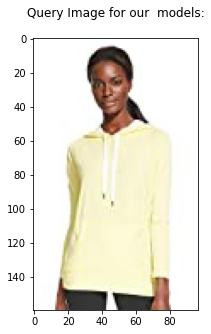

In [30]:
### let's get the given image

url = data.iloc[12500]['medium_image_url']
response = requests.get(url)
img = Image.open(BytesIO(response.content))

fig = plt.figure(figsize=(10,5))
plt.imshow(img)
plt.title('Query Image for our  models:\n')
print('*'*70)
print('\n')
print(data.iloc[12500]['title'])
print('\n')
print('*'*70)


## [8.2] Bag of Words (BoW) on product titles.

In [30]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus
# What is a sparse vector?
# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16434, 12684)

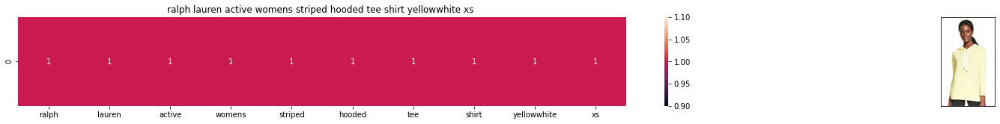

ASIN : B01JME4H6W
Brand: Ralph Lauren Active
Title: ralph lauren active womens striped hooded tee shirt yellowwhite xs 
Euclidean similarity with the query image : 0.0


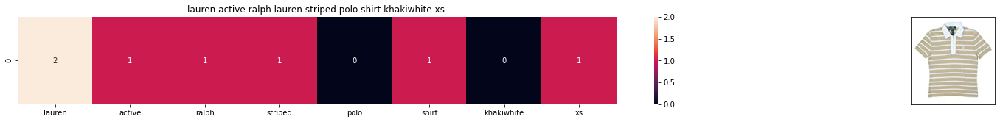

ASIN : B00ILGK6H2
Brand: Ralph Lauren Active
Title: lauren active ralph lauren striped polo shirt khakiwhite xs 
Euclidean similarity with the query image : 2.6457513110645907


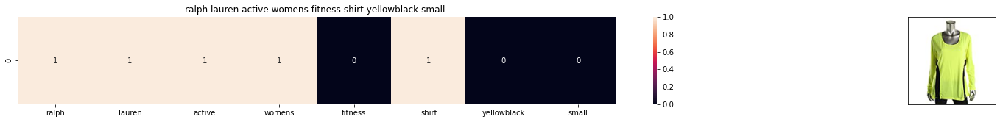

ASIN : B073WGPVWV
Brand: Ralph Lauren Active
Title: ralph lauren active womens fitness shirt yellowblack small 
Euclidean similarity with the query image : 2.8284271247461903


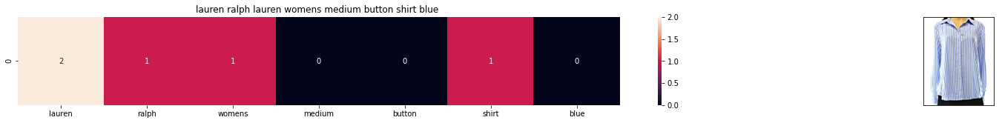

ASIN : B074ZLGXPL
Brand: Lauren by Ralph Lauren
Title: lauren ralph lauren womens medium button shirt blue 
Euclidean similarity with the query image : 3.1622776601683795


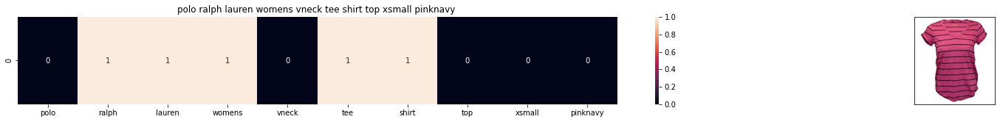

ASIN : B01ETUBK3W
Brand: RALPH LAUREN
Title: polo ralph lauren womens vneck tee shirt top xsmall pinknavy 
Euclidean similarity with the query image : 3.1622776601683795


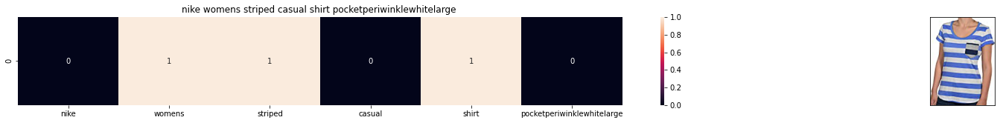

ASIN : B003VJMU7S
Brand: Estwarkim
Title: nike womens striped casual shirt pocketperiwinklewhitelarge 
Euclidean similarity with the query image : 3.1622776601683795


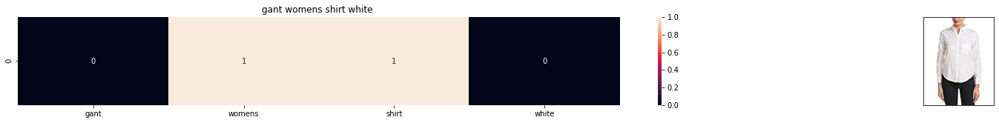

ASIN : B01N80ZGZX
Brand: GANT
Title: gant womens shirt white 
Euclidean similarity with the query image : 3.1622776601683795


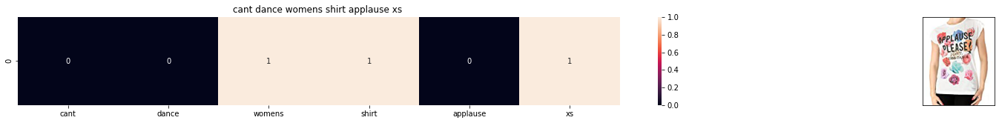

ASIN : B01IN5NJRE
Brand: I can't I have dance
Title: cant dance womens shirt applause xs 
Euclidean similarity with the query image : 3.1622776601683795


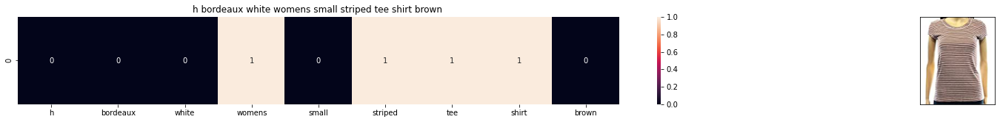

ASIN : B072BVB47Z
Brand: H By Bordeaux
Title: h bordeaux white womens small striped tee shirt brown 
Euclidean similarity with the query image : 3.1622776601683795


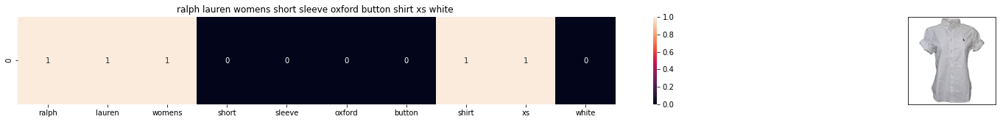

ASIN : B01FRIMR5U
Brand: RALPH LAUREN
Title: ralph lauren womens short sleeve oxford button shirt xs white 
Euclidean similarity with the query image : 3.1622776601683795


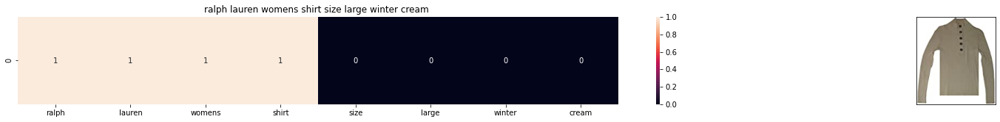

ASIN : B005YBMMTM
Brand: Lauren Jeans Co.
Title: ralph lauren womens shirt size large winter cream 
Euclidean similarity with the query image : 3.1622776601683795


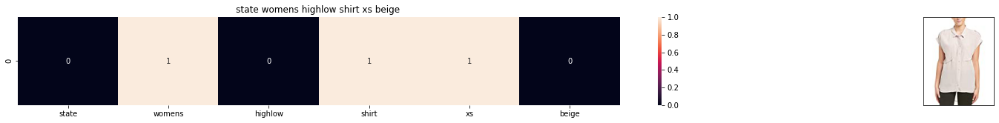

ASIN : B074MGSQTJ
Brand: State of Being
Title: state womens highlow shirt xs beige 
Euclidean similarity with the query image : 3.1622776601683795


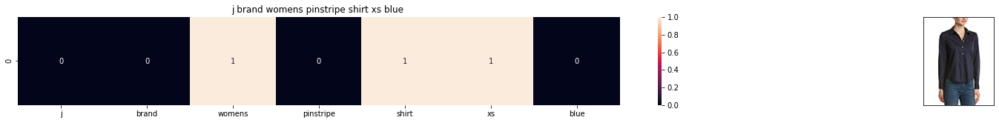

ASIN : B06XYP1X1F
Brand: J Brand Jeans
Title: j brand womens pinstripe shirt xs blue 
Euclidean similarity with the query image : 3.1622776601683795


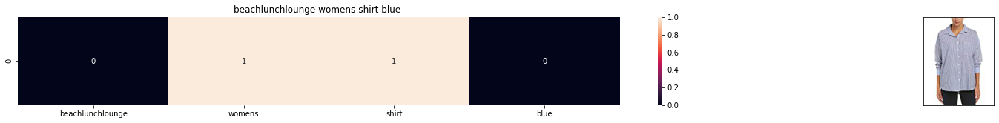

ASIN : B074SZ54KJ
Brand: Beach Lunch Lounge
Title: beachlunchlounge womens shirt blue 
Euclidean similarity with the query image : 3.1622776601683795


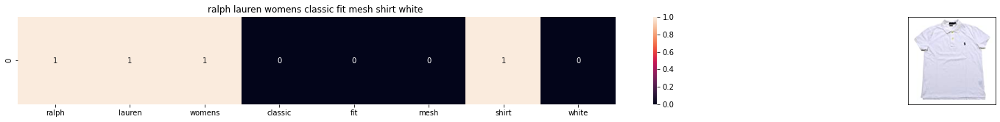

ASIN : B01KIXF87S
Brand: RALPH LAUREN
Title: ralph lauren womens classic fit mesh shirt white 
Euclidean similarity with the query image : 3.1622776601683795


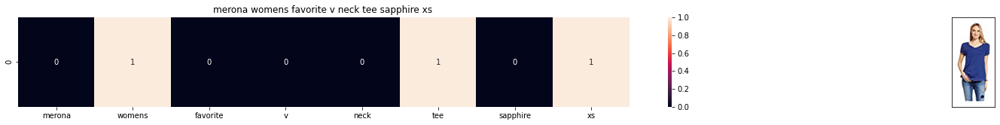

ASIN : B06ZZXJ73F
Brand: Merona
Title: merona womens favorite v neck tee sapphire xs 
Euclidean similarity with the query image : 3.3166247903554


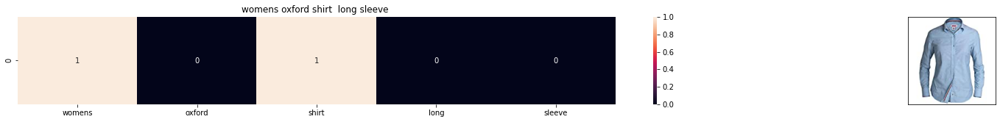

ASIN : B01577JZOC
Brand: Boast
Title: womens oxford shirt  long sleeve 
Euclidean similarity with the query image : 3.3166247903554


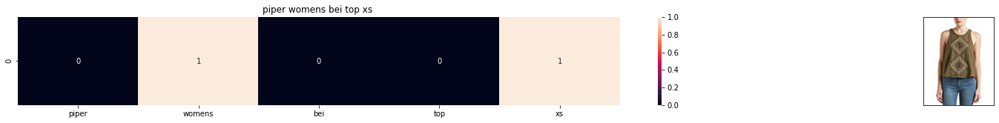

ASIN : B06X6FFZXQ
Brand: Piper
Title: piper womens bei top xs 
Euclidean similarity with the query image : 3.3166247903554


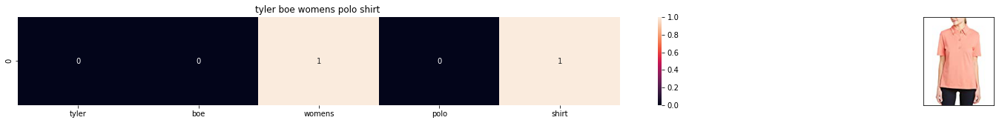

ASIN : B01MQ0TIKA
Brand: TYLER BOE
Title: tyler boe womens polo shirt 
Euclidean similarity with the query image : 3.3166247903554


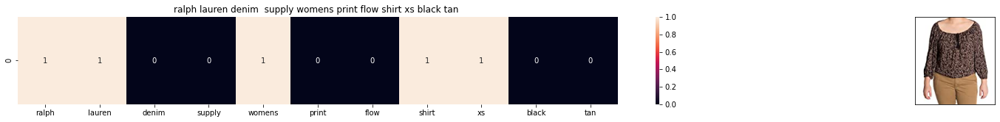

ASIN : B00X07M40Y
Brand: RALPH LAUREN
Title: ralph lauren denim  supply womens print flow shirt xs black tan 
Euclidean similarity with the query image : 3.3166247903554


In [32]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]],
                   data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(12500, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

#try 12566
#try 931

* We can see that the BOW model is able to capture the attributes brand ralph lauren,size xs,and womens shirts of the query point well.
* But there are few irrelevent predictions as well

## [8.5] TF-IDF based product similarity

In [37]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * # words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

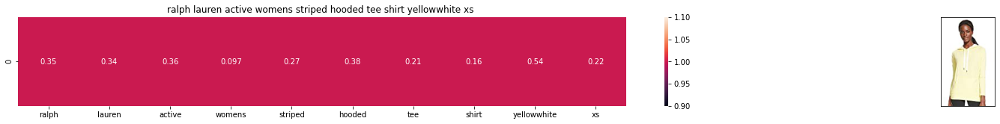

ASIN : B01JME4H6W
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 0.0


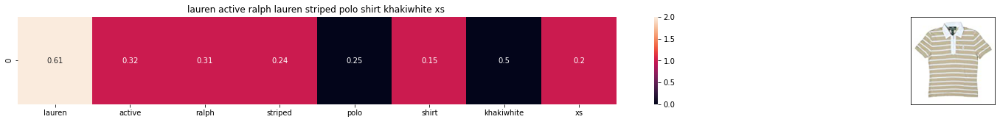

ASIN : B00ILGK6H2
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 0.9320483484271197


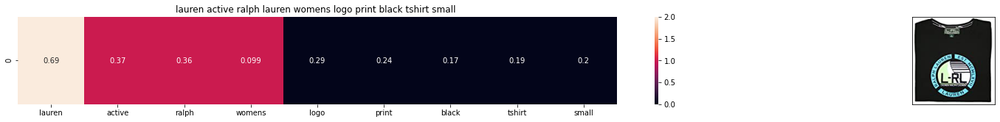

ASIN : B01E1SZIGM
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 0.9966336121056003


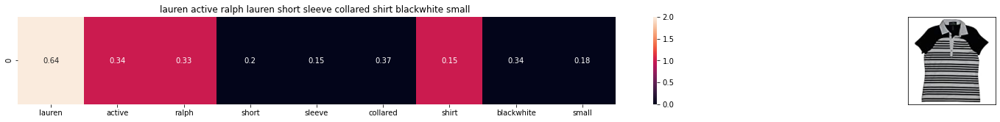

ASIN : B00HSX5ZAW
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 1.0214919565354412


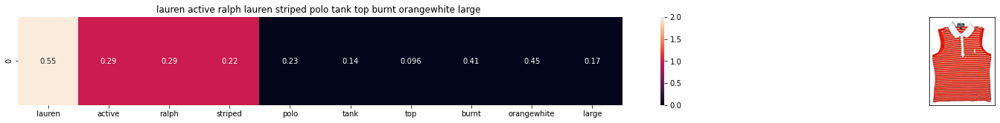

ASIN : B00ILGH5OY
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 1.045589333445831


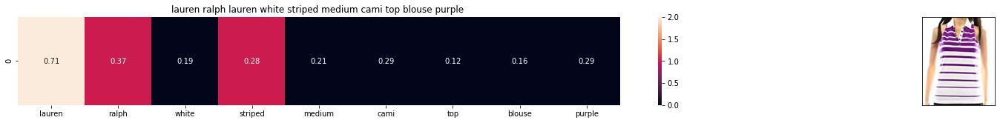

ASIN : B071GNRN41
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.0537050304614235


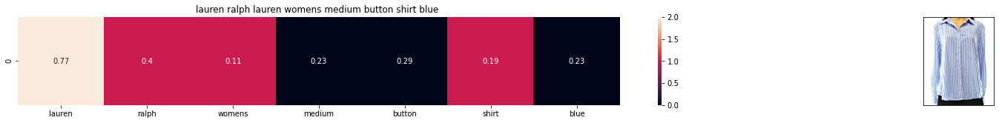

ASIN : B074ZLGXPL
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.0547650799594113


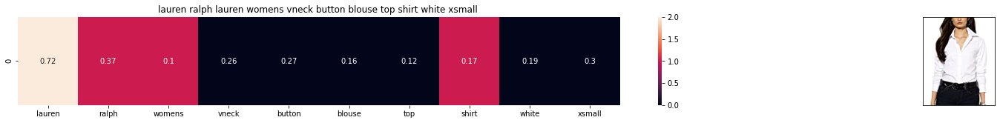

ASIN : B0713MCCFX
BRAND : RALPH LAUREN
Eucliden distance from the given image : 1.085582739736363


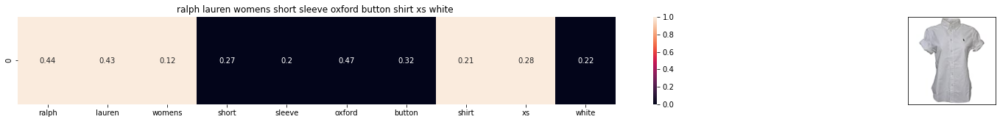

ASIN : B01FRIMR5U
BRAND : RALPH LAUREN
Eucliden distance from the given image : 1.0902504770217765


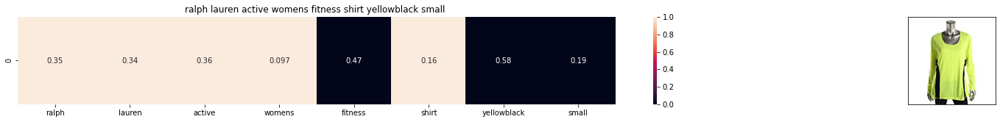

ASIN : B073WGPVWV
BRAND : Ralph Lauren Active
Eucliden distance from the given image : 1.0910155531611962


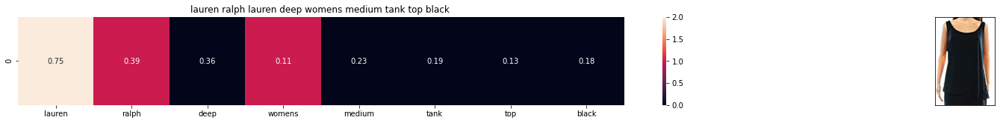

ASIN : B071P2NNYV
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.0935678614530933


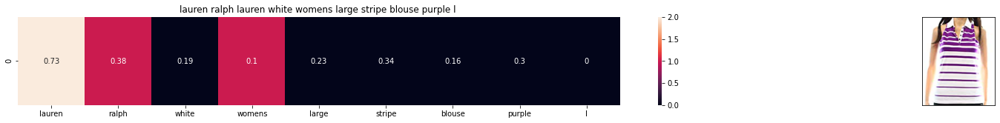

ASIN : B0721MX9G5
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.1051456378086082


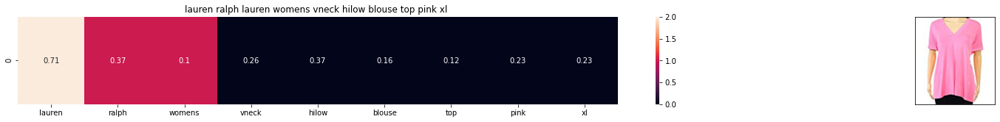

ASIN : B073RHR45N
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.1145413472144106


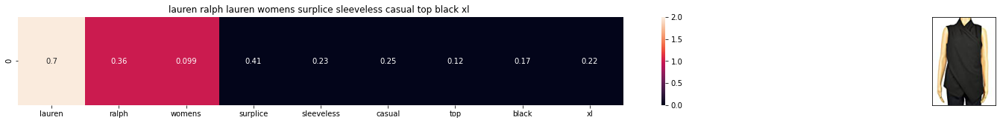

ASIN : B01N6RZPQW
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.1199457275970173


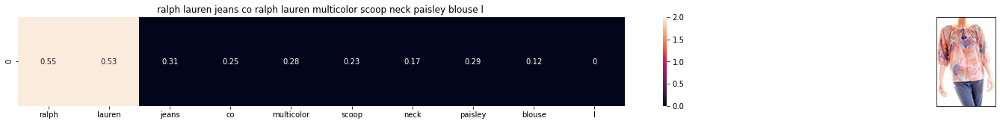

ASIN : B00CEMR4I8
BRAND : Polo Jeans Co.
Eucliden distance from the given image : 1.1206009276727187


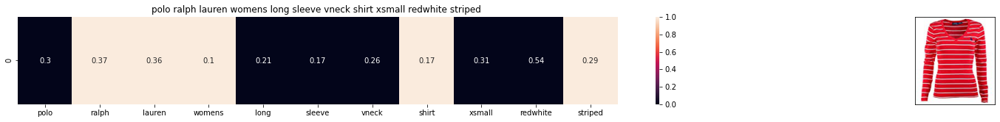

ASIN : B01MRL7J8F
BRAND : Polo Ralph Lauren
Eucliden distance from the given image : 1.1232830531545737


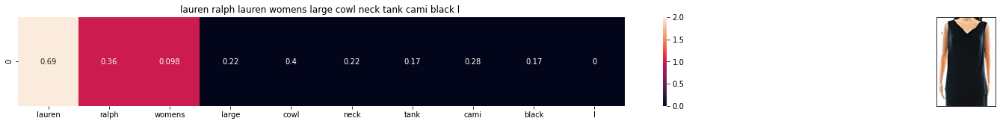

ASIN : B071YSRY3L
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.125300003432815


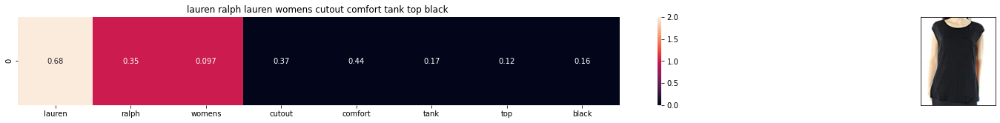

ASIN : B01N1K1YAO
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.127620677491475


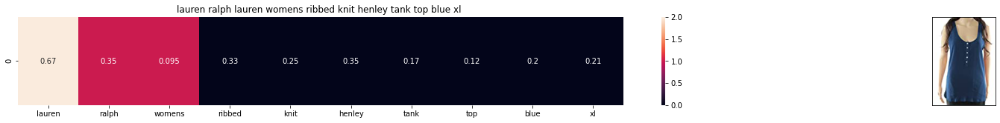

ASIN : B0723511ZF
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.13298860836888


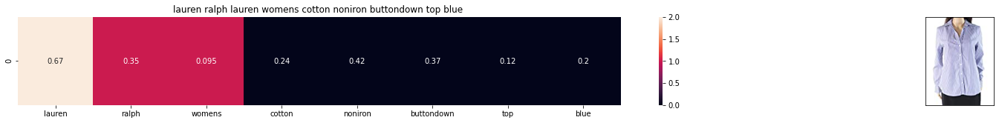

ASIN : B06XYMZRM4
BRAND : Lauren by Ralph Lauren
Eucliden distance from the given image : 1.1333503203455155


In [38]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12500, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

* Like BOW  tfidf model also captures mostly brand and size from the title and still the hooded shirts are not captured well.

## [8.5] IDF based product similarity

In [42]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [43]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [44]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

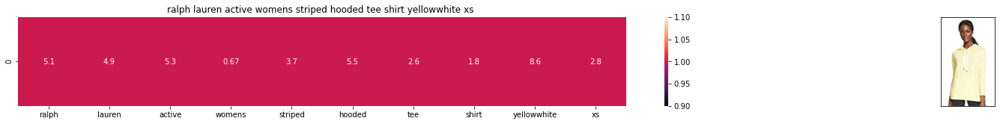

ASIN : B01JME4H6W
Brand : Ralph Lauren Active
euclidean distance from the given image : 0.0


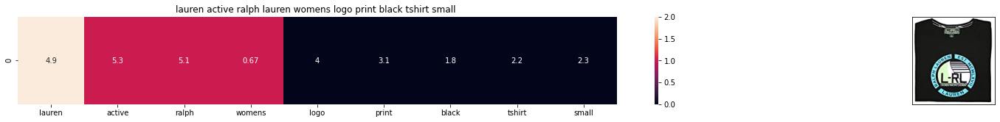

ASIN : B01E1SZIGM
Brand : Ralph Lauren Active
euclidean distance from the given image : 13.228798576031664


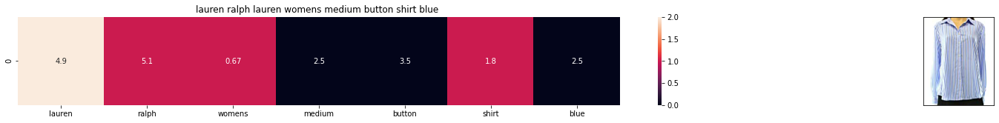

ASIN : B074ZLGXPL
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 13.612803029699675


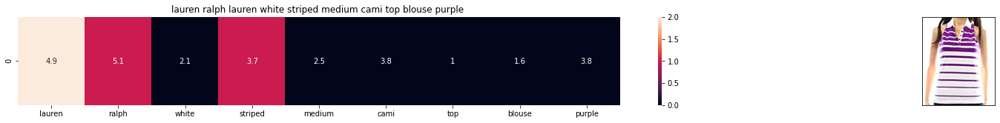

ASIN : B071GNRN41
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 13.919513741683694


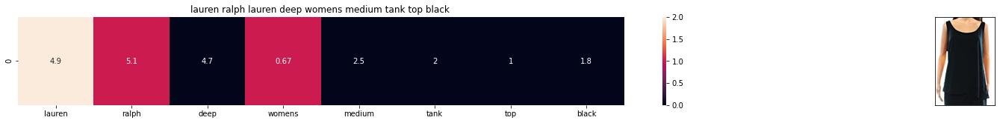

ASIN : B071P2NNYV
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 14.166980340044182


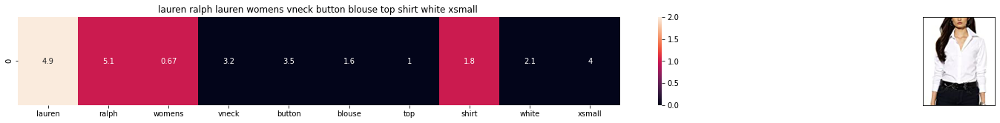

ASIN : B0713MCCFX
Brand : RALPH LAUREN
euclidean distance from the given image : 14.385422620755923


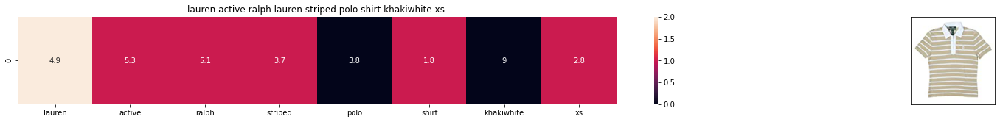

ASIN : B00ILGK6H2
Brand : Ralph Lauren Active
euclidean distance from the given image : 14.408967070455487


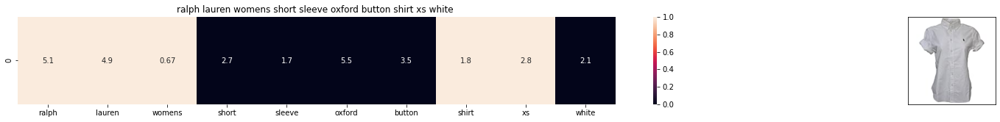

ASIN : B01FRIMR5U
Brand : RALPH LAUREN
euclidean distance from the given image : 14.471140950035464


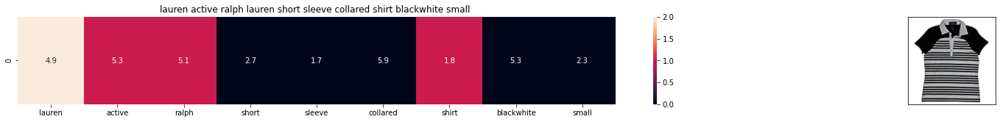

ASIN : B00HSX5ZAW
Brand : Ralph Lauren Active
euclidean distance from the given image : 14.554246695559463


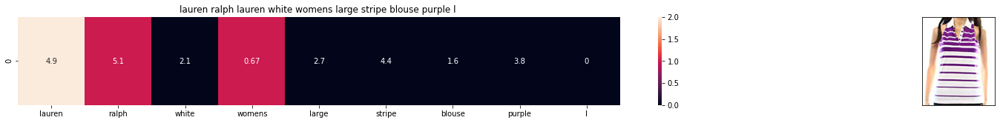

ASIN : B0721MX9G5
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 14.555043023530818


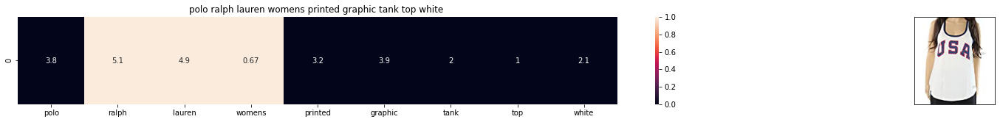

ASIN : B01NAP3SFK
Brand : Polo Ralph Lauren
euclidean distance from the given image : 14.596981500660664


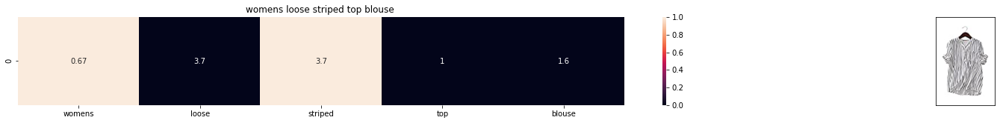

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 14.745687999762726


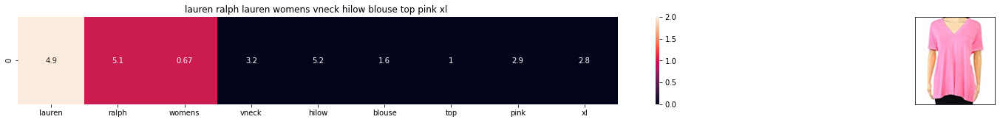

ASIN : B073RHR45N
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 14.86907825286474


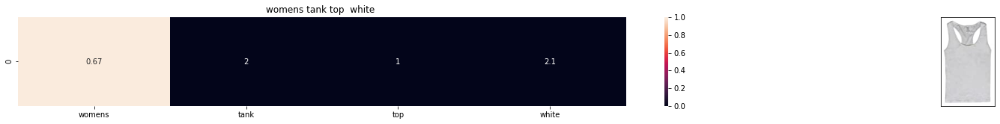

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 14.926585124479391


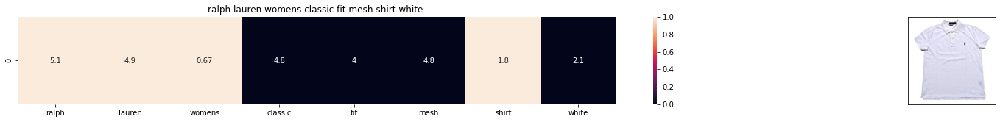

ASIN : B01KIXF87S
Brand : RALPH LAUREN
euclidean distance from the given image : 15.062503177033417


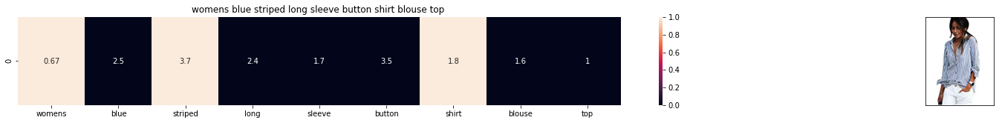

ASIN : B01KM2OLIW
Brand : Voguegirl
euclidean distance from the given image : 15.073128747546114


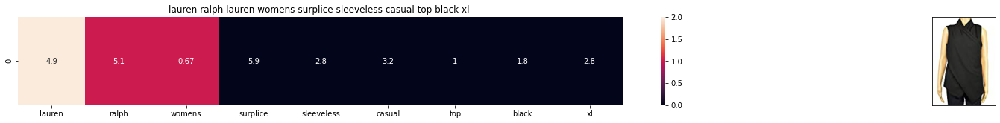

ASIN : B01N6RZPQW
Brand : Lauren by Ralph Lauren
euclidean distance from the given image : 15.122329251244038


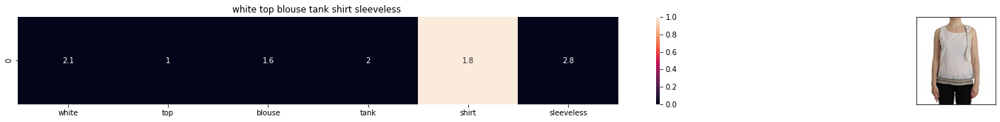

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 15.182130236391776


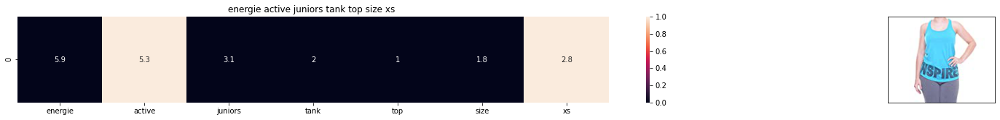

ASIN : B071RSQFKQ
Brand : Energie
euclidean distance from the given image : 15.205561495747867


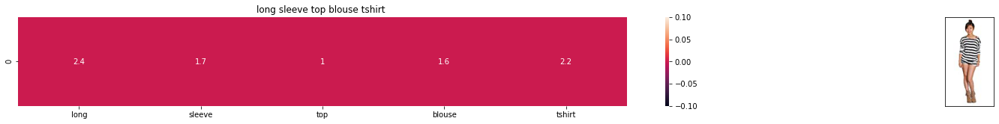

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 15.208661081568088


In [38]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]],
                   data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12500,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# [9] Text Semantics based product similarity

In [35]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [36]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    try :
        # np.concatenate((sentence2.split(),[sentence2.split()[0]]))
        # np.concatenate((sentence1.split(),[sentence1.split()[0]]))
        ax.set_xticklabels(sentence2.split())
        # set the y axis labels as input apparels title
        ax.set_yticklabels(sentence1.split())
        # set title as recommended apparels title
        ax.set_title(sentence2)
    except:
        ax.set_xticklabels(np.concatenate((sentence2.split(),[sentence2.split()[0]])))
        # set the y axis labels as input apparels title
        ax.set_yticklabels(np.concatenate((sentence1.split(),[sentence1.split()[0]])))
        # set title as recommended apparels title
        ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [37]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### [9.2] Average Word2Vec product similarity.

In [38]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

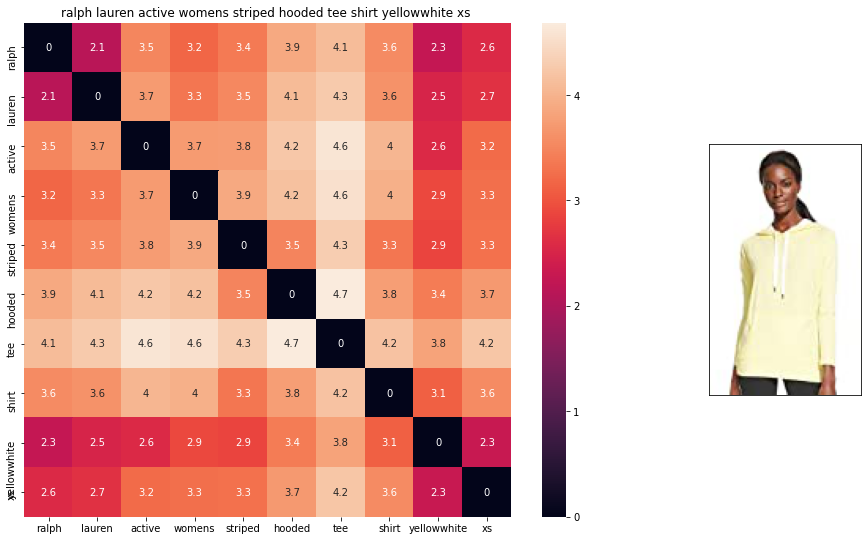

ASIN : B01JME4H6W
BRAND : Ralph Lauren Active
euclidean distance from given input image : 0.0


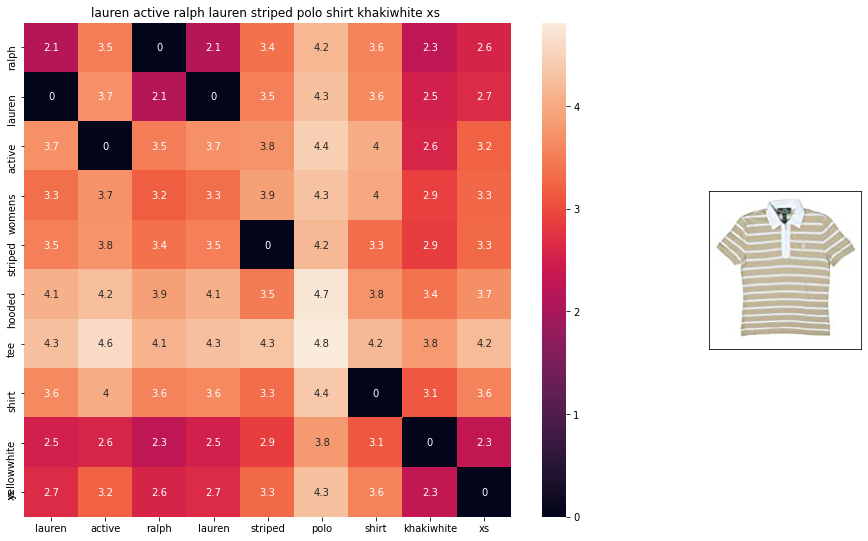

ASIN : B00ILGK6H2
BRAND : Ralph Lauren Active
euclidean distance from given input image : 0.70010304


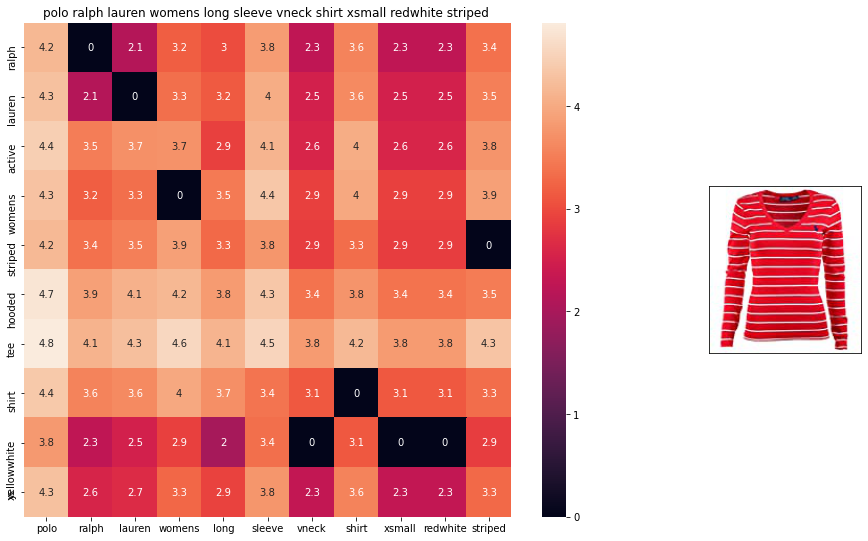

ASIN : B01MRL7J8F
BRAND : Polo Ralph Lauren
euclidean distance from given input image : 0.7125932


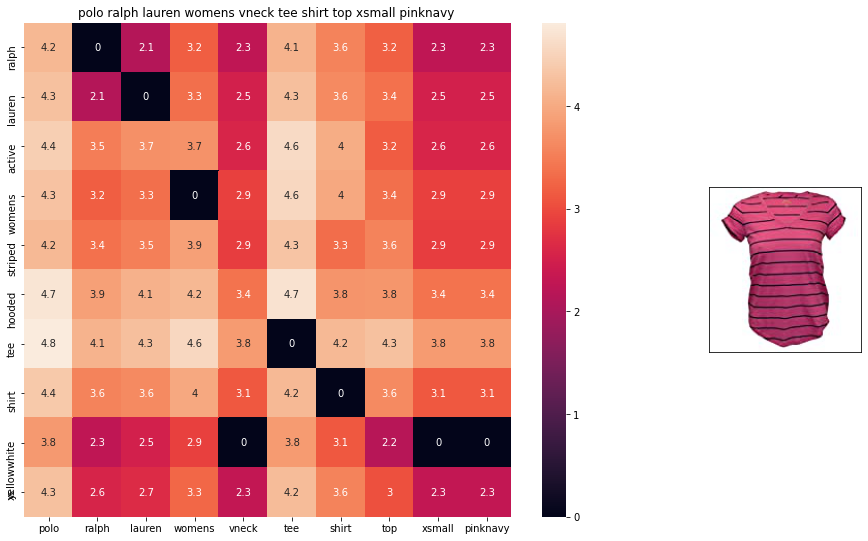

ASIN : B01ETUBK3W
BRAND : RALPH LAUREN
euclidean distance from given input image : 0.7143427


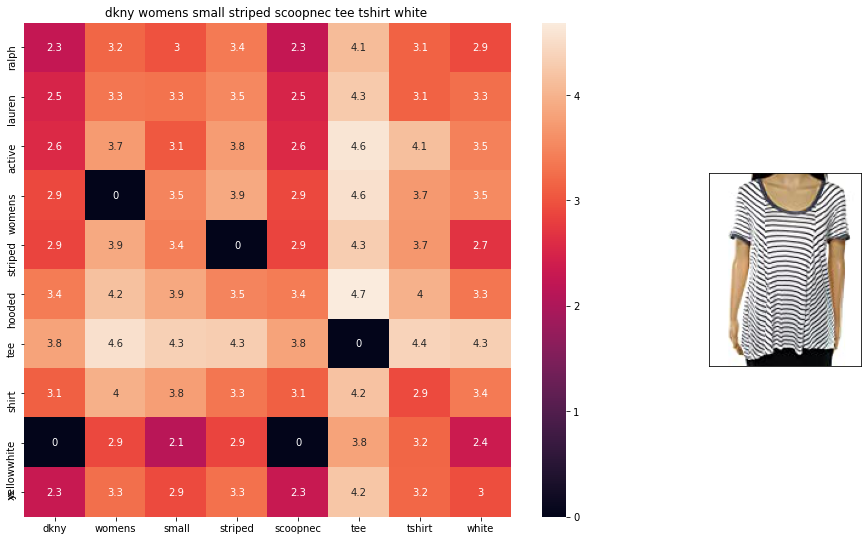

ASIN : B0725PWQFW
BRAND : DKNY
euclidean distance from given input image : 0.7170714


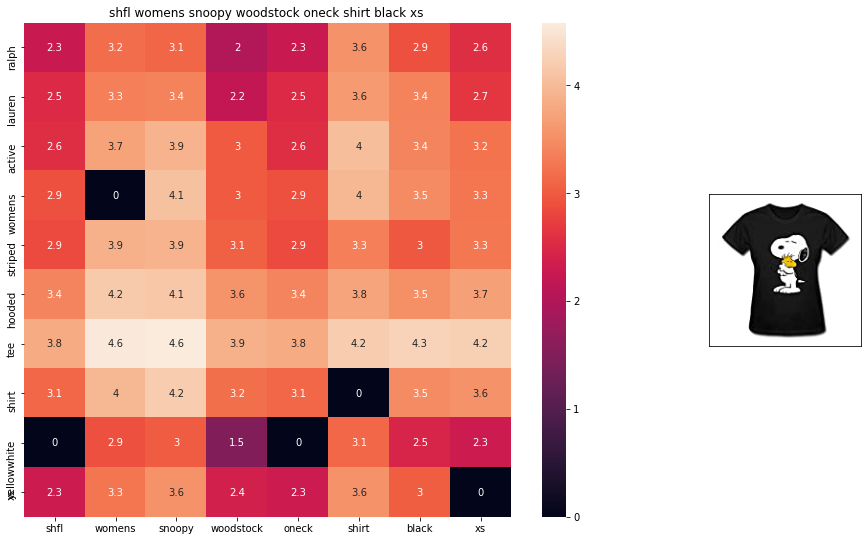

ASIN : B0166856BW
BRAND : SHFL
euclidean distance from given input image : 0.7533704


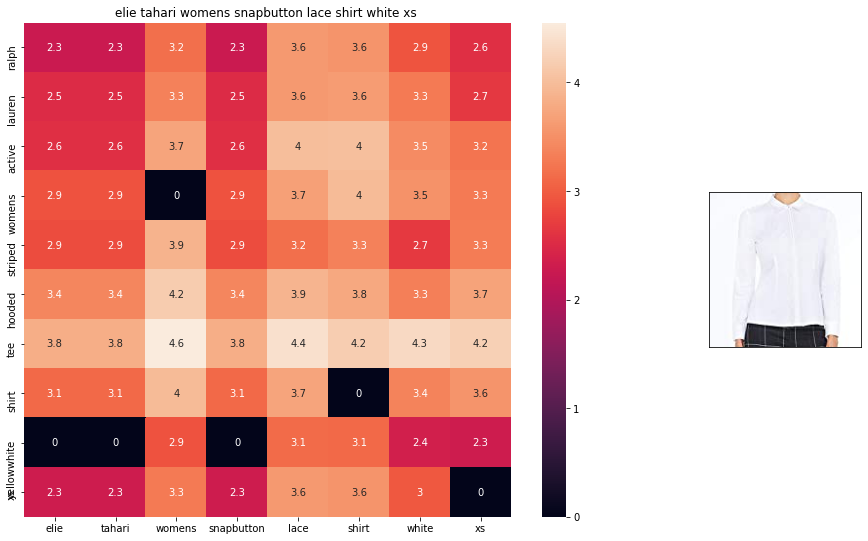

ASIN : B06X8YS632
BRAND : Elie Tahari
euclidean distance from given input image : 0.7700933


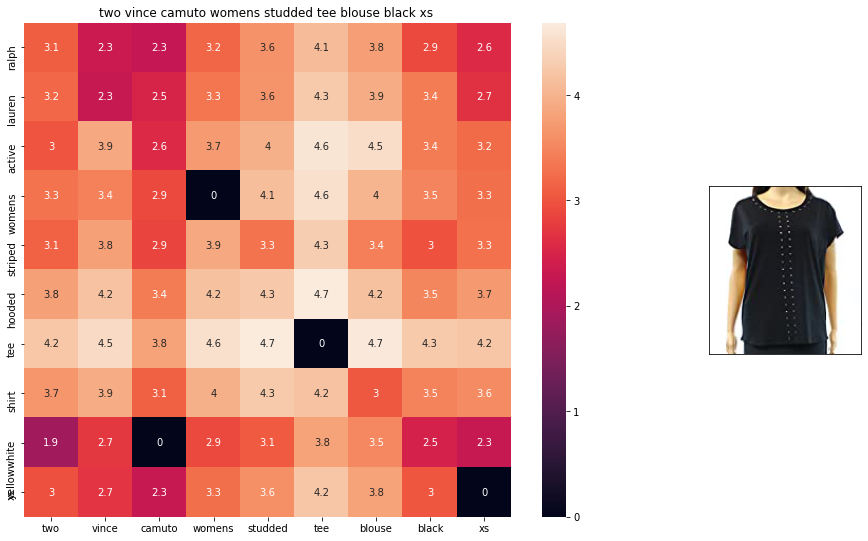

ASIN : B071GZJ5C8
BRAND : Two by Vince Camuto
euclidean distance from given input image : 0.7760781


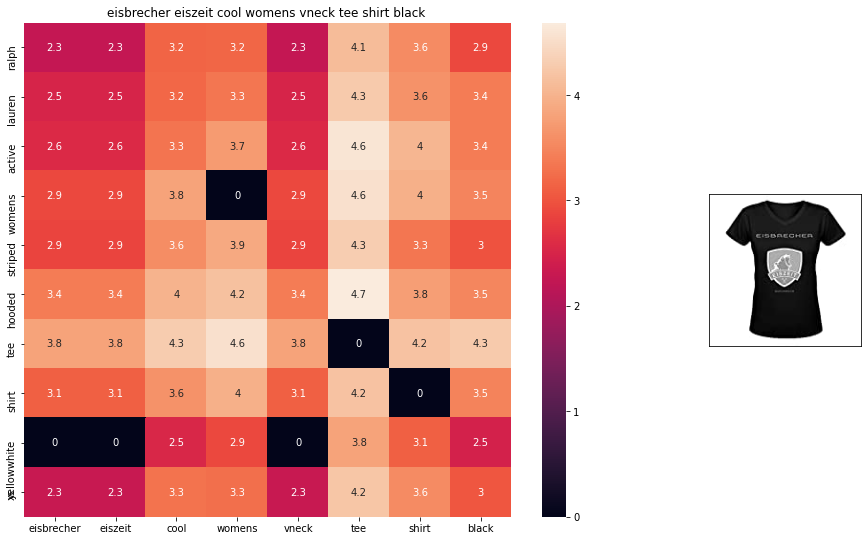

ASIN : B01IT9KGS4
BRAND : Bunny Angle
euclidean distance from given input image : 0.77783227


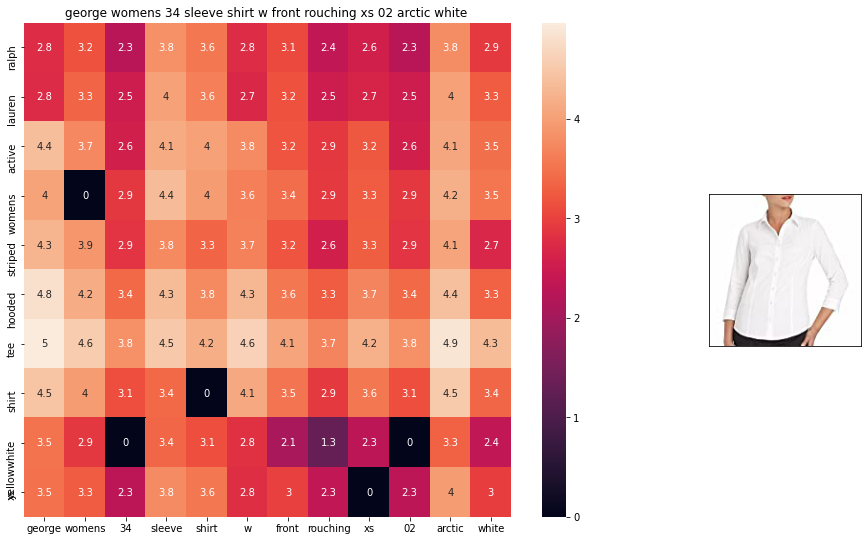

ASIN : B01MSHGL5V
BRAND : George
euclidean distance from given input image : 0.7824235


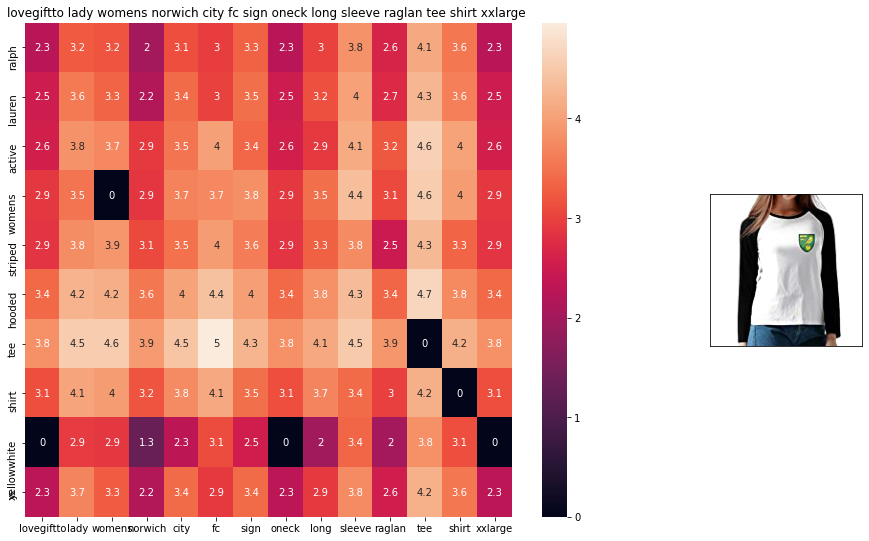

ASIN : B01M347EO1
BRAND : LOVEGIFTTO LADY
euclidean distance from given input image : 0.7842254


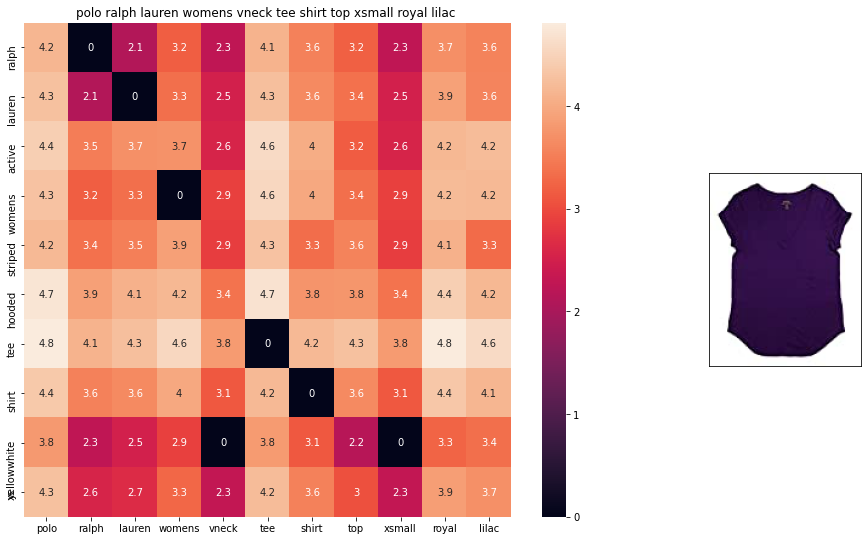

ASIN : B01EYZZE5W
BRAND : RALPH LAUREN
euclidean distance from given input image : 0.78609735


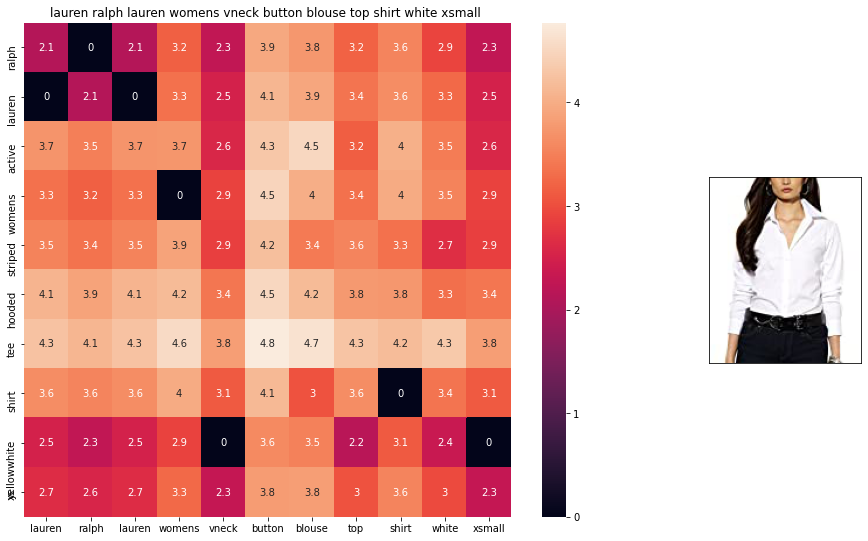

ASIN : B0713MCCFX
BRAND : RALPH LAUREN
euclidean distance from given input image : 0.7862537


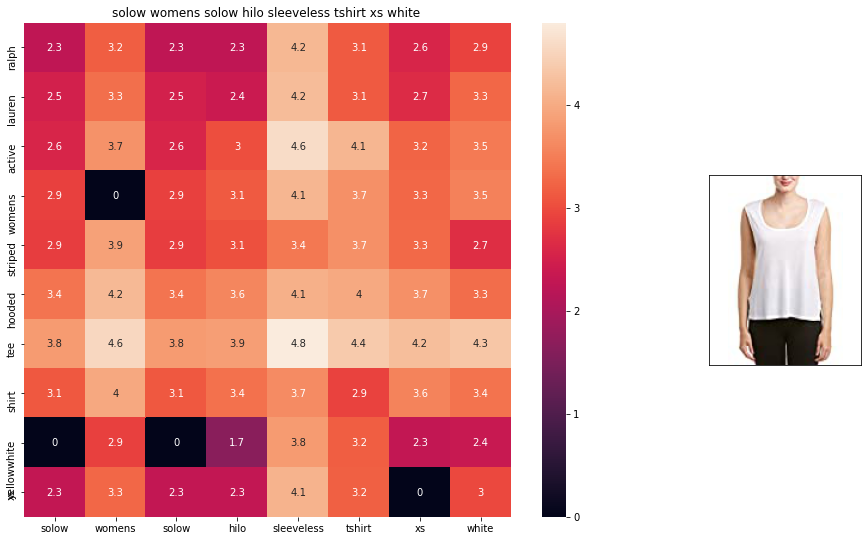

ASIN : B01M292SR6
BRAND : SOLOW
euclidean distance from given input image : 0.7898404


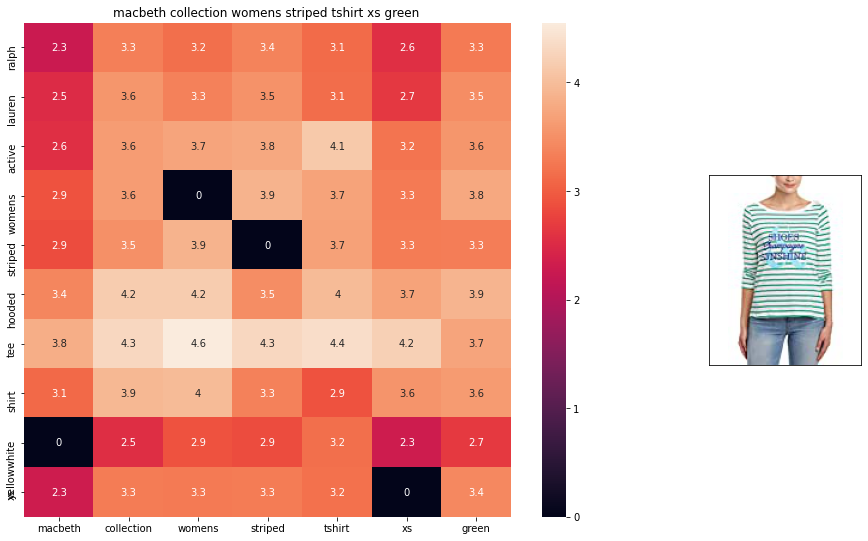

ASIN : B01E3CPLJK
BRAND : Macbeth Collection
euclidean distance from given input image : 0.79283816


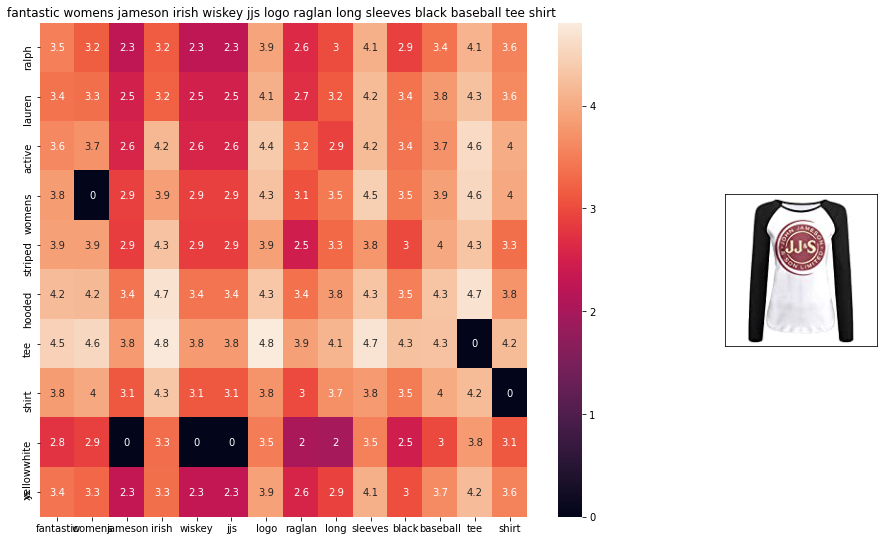

ASIN : B01MCXK7C1
BRAND : Raglan Baseball Shirt
euclidean distance from given input image : 0.7957387


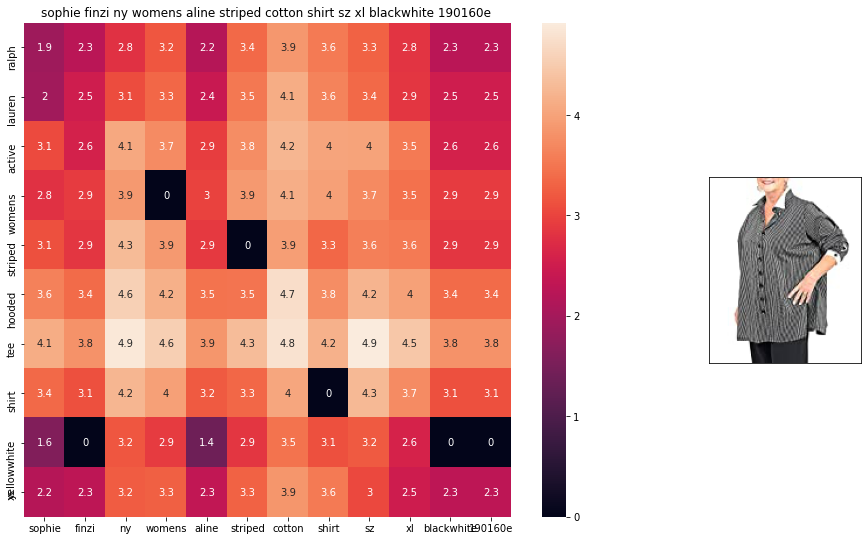

ASIN : B01EKAMNVE
BRAND : SOPHIE FINZI
euclidean distance from given input image : 0.79599833


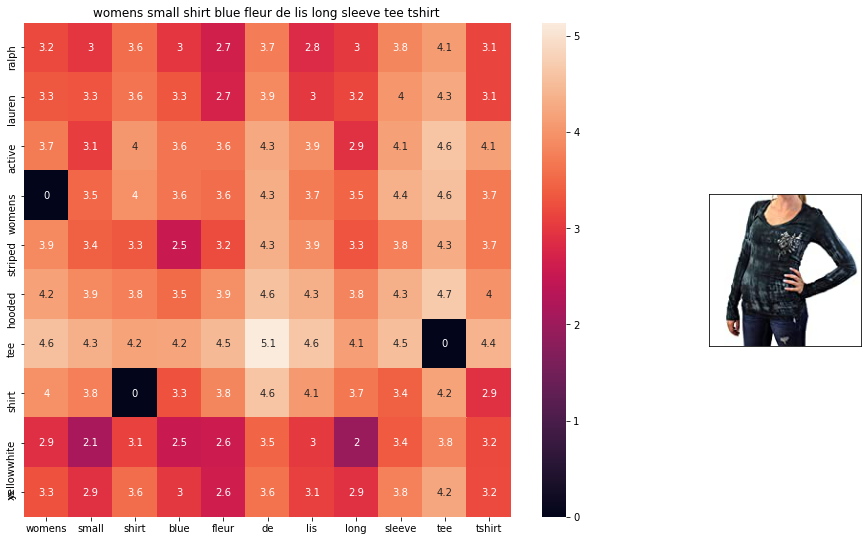

ASIN : B01DICD4ZO
BRAND : URBAN X
euclidean distance from given input image : 0.7979921


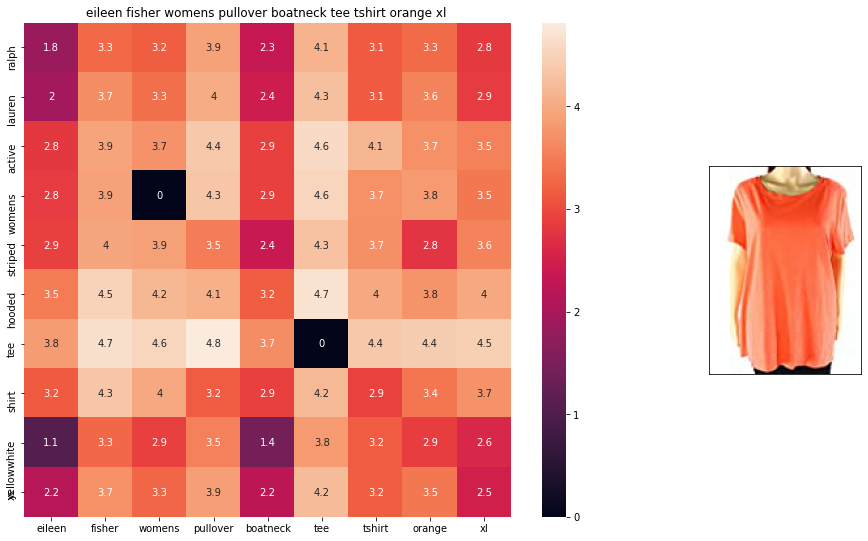

ASIN : B0752Z5QLC
BRAND : Eileen Fisher
euclidean distance from given input image : 0.7992172


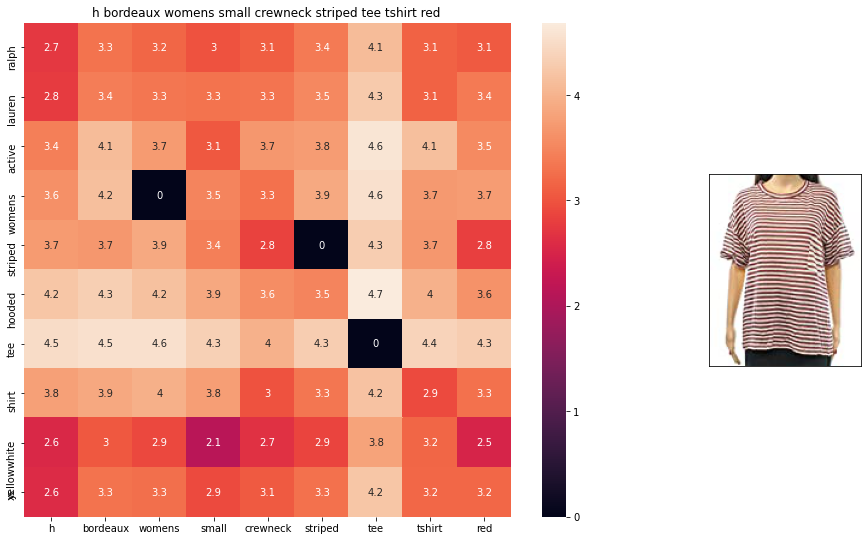

ASIN : B072FGSJ15
BRAND : H By Bordeaux
euclidean distance from given input image : 0.8040256


In [62]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12500, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### [9.4]  IDF weighted Word2Vec for product similarity


In [46]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

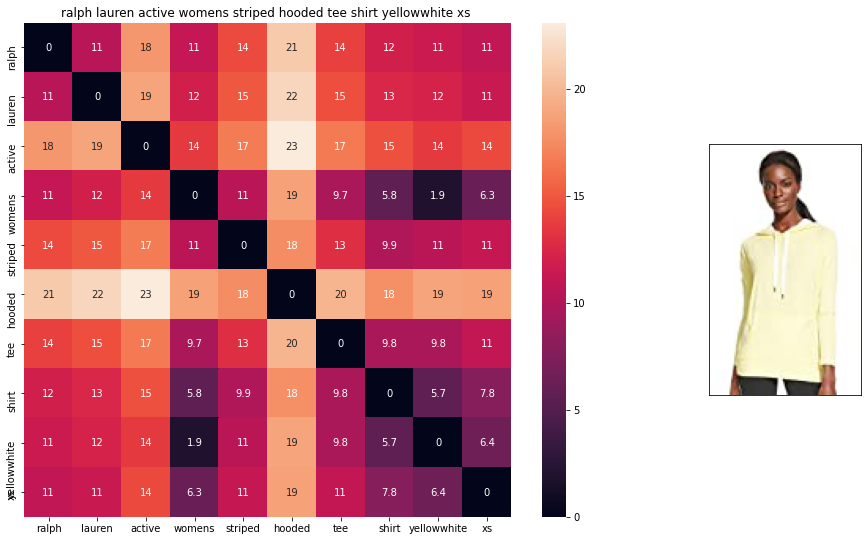

ASIN : B01JME4H6W
Brand : Ralph Lauren Active
euclidean distance from input : 0.0


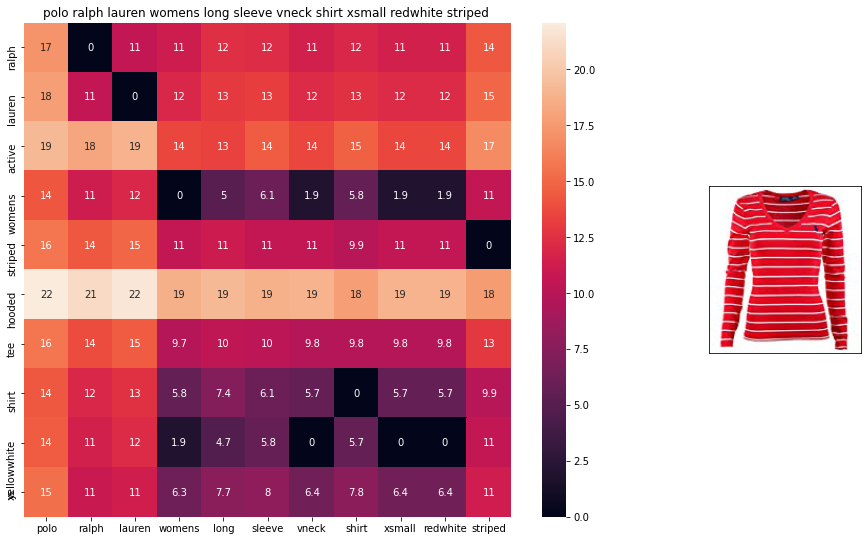

ASIN : B01MRL7J8F
Brand : Polo Ralph Lauren
euclidean distance from input : 2.8538036


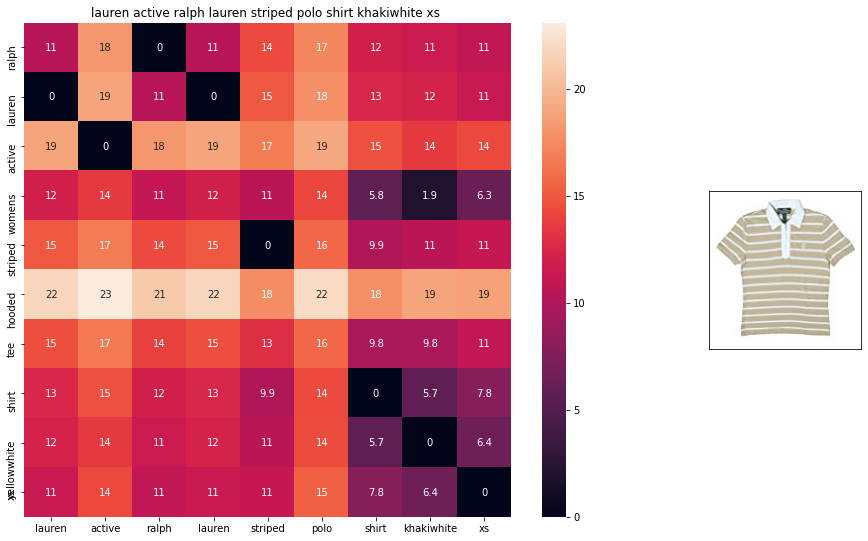

ASIN : B00ILGK6H2
Brand : Ralph Lauren Active
euclidean distance from input : 2.8810923


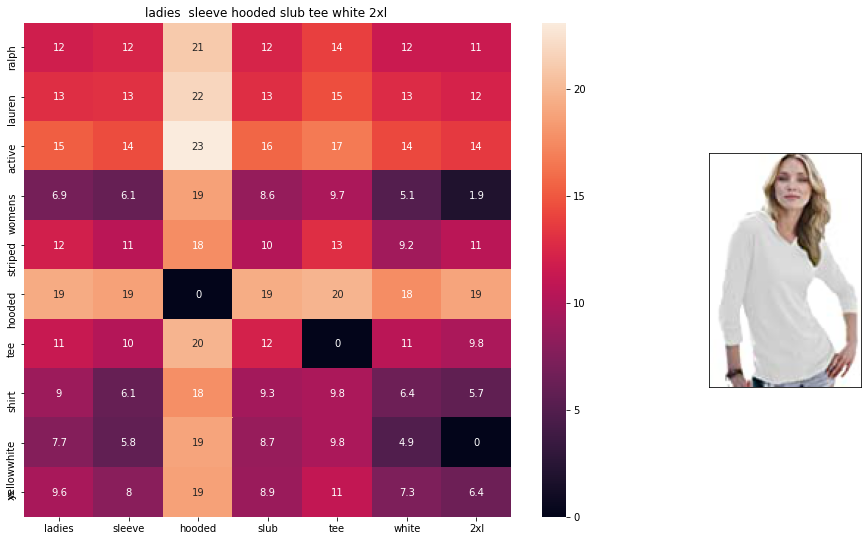

ASIN : B00CO8F6XW
Brand : J. America
euclidean distance from input : 2.992326


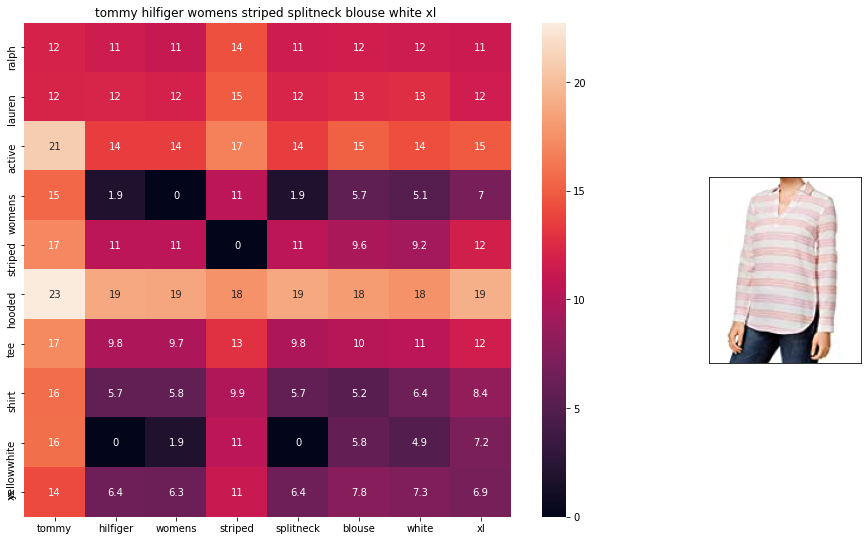

ASIN : B071VBTCXP
Brand : Tommy Hilfiger
euclidean distance from input : 2.9987054


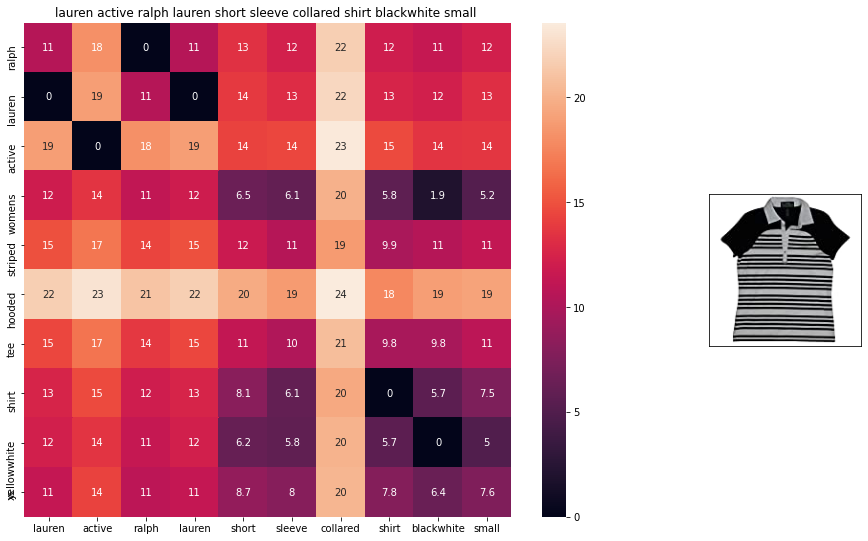

ASIN : B00HSX5ZAW
Brand : Ralph Lauren Active
euclidean distance from input : 3.0545192


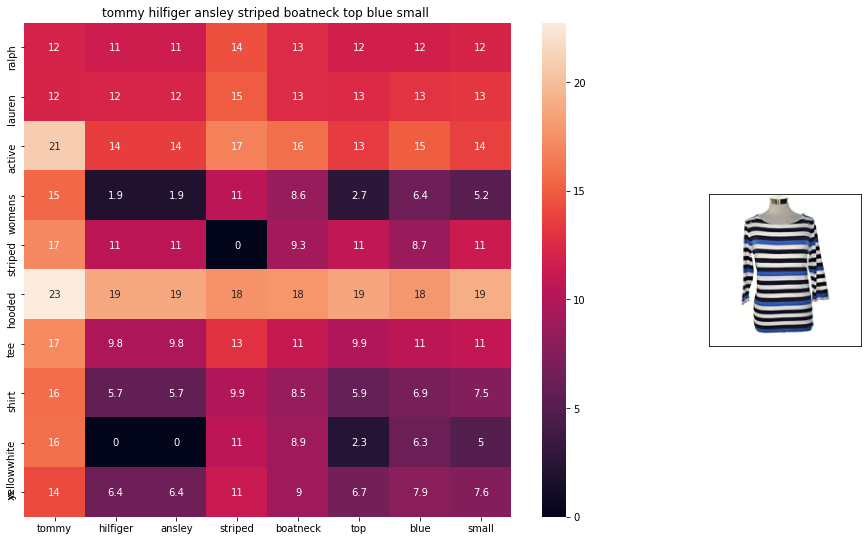

ASIN : B01LYYU8BB
Brand : Tommy Hilfiger
euclidean distance from input : 3.0882964


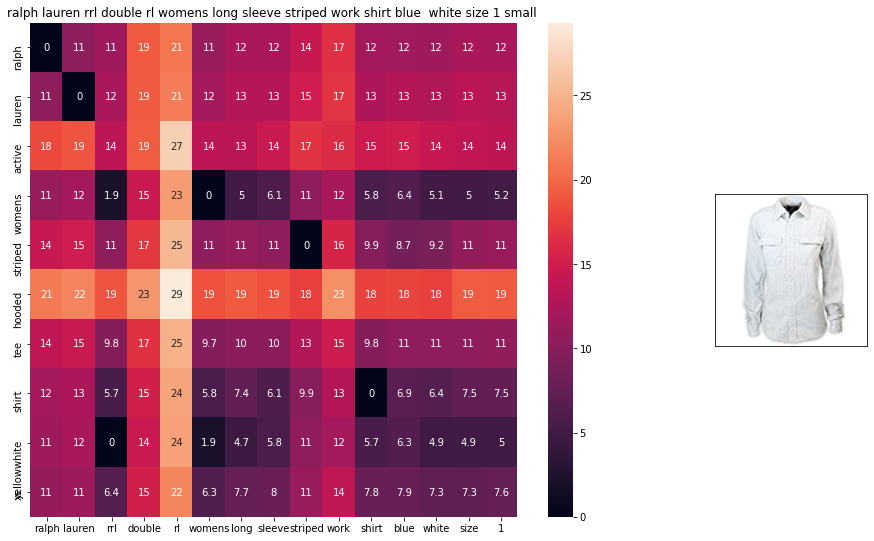

ASIN : B01K5BRKGK
Brand : RRL
euclidean distance from input : 3.0914545


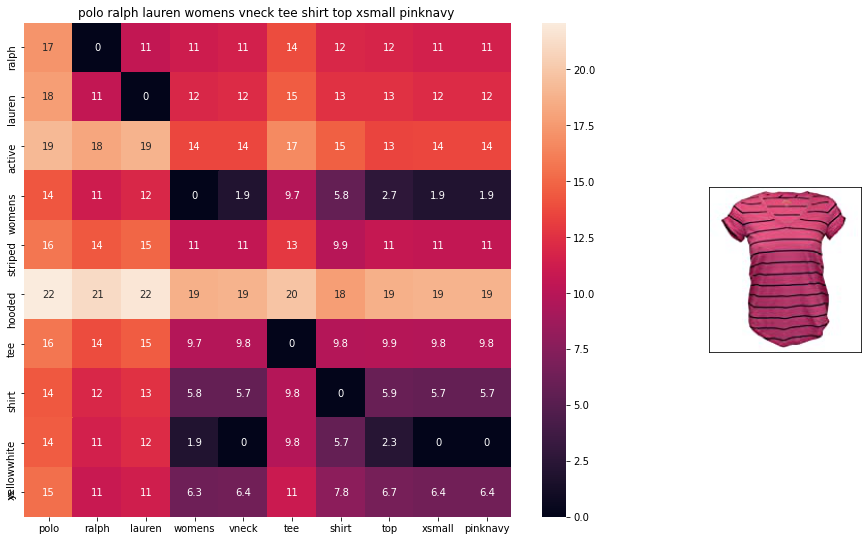

ASIN : B01ETUBK3W
Brand : RALPH LAUREN
euclidean distance from input : 3.1127374


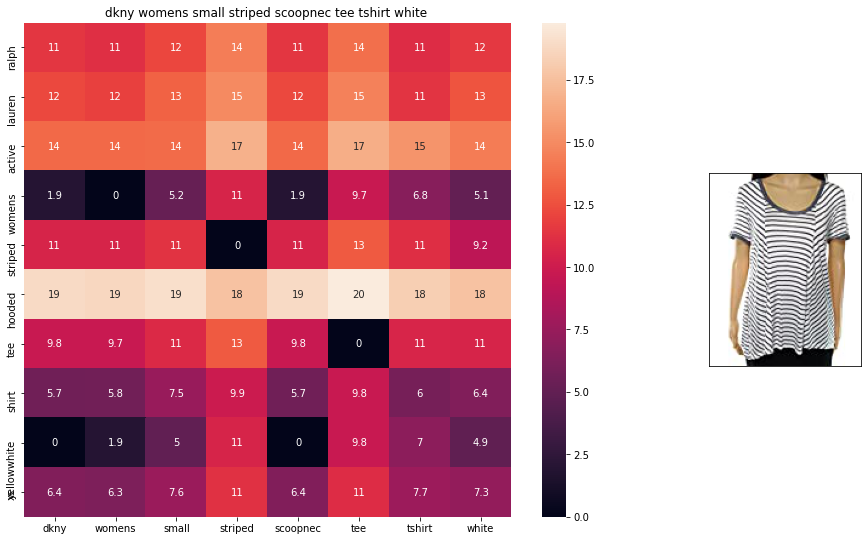

ASIN : B0725PWQFW
Brand : DKNY
euclidean distance from input : 3.1371267


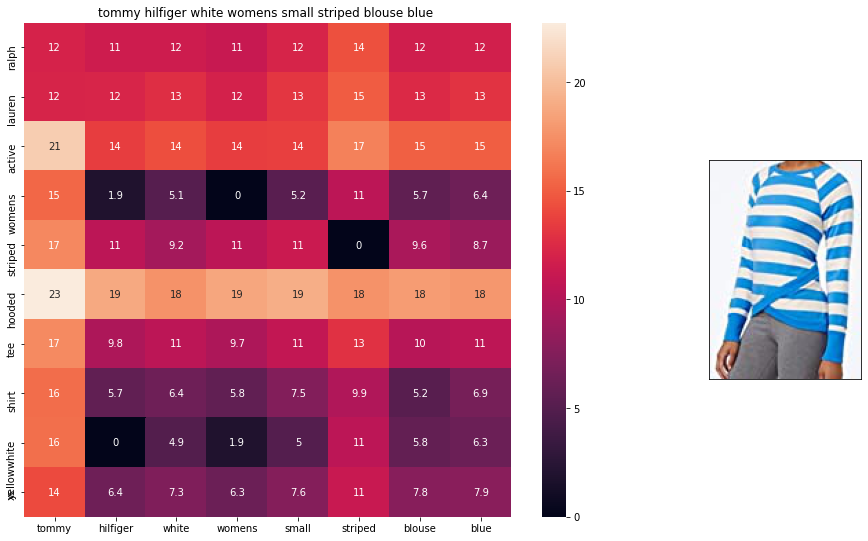

ASIN : B0759NSBV6
Brand : Tommy Hilfiger
euclidean distance from input : 3.1382675


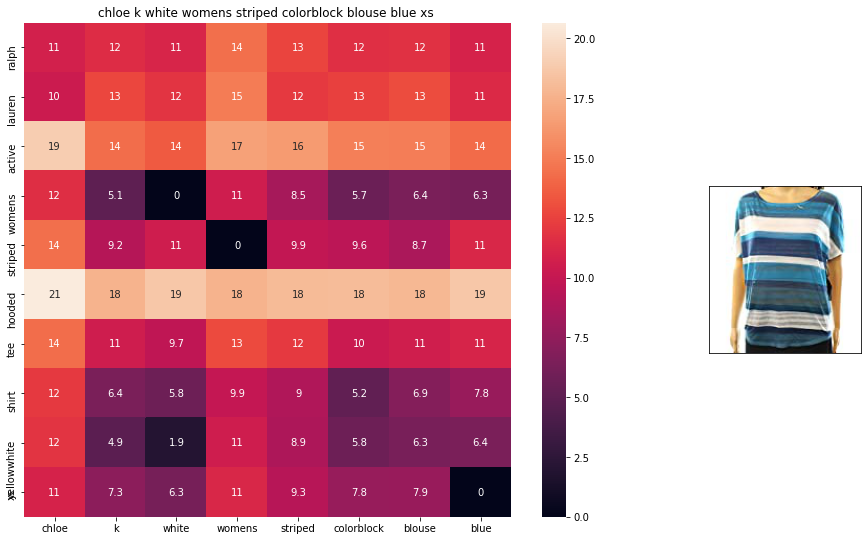

ASIN : B074QTKXPP
Brand : Chloe K.
euclidean distance from input : 3.1397839


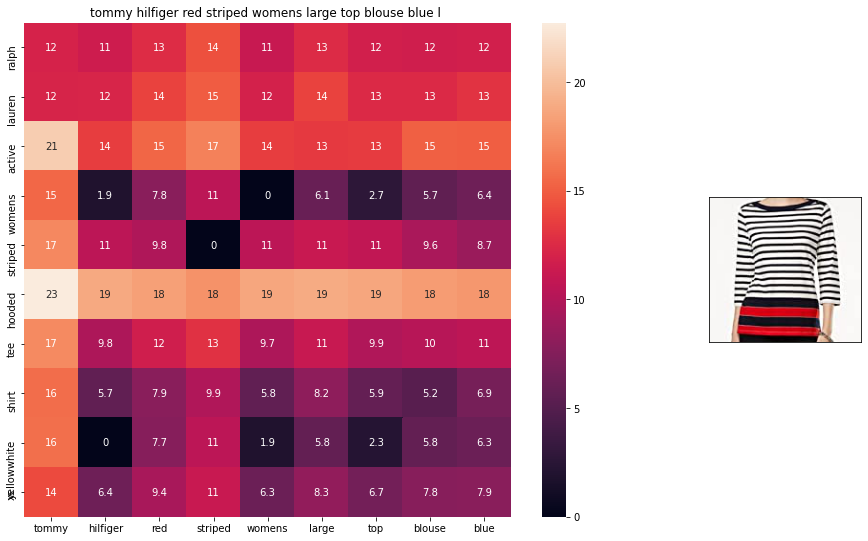

ASIN : B0759NLYJP
Brand : Tommy Hilfiger
euclidean distance from input : 3.1414907


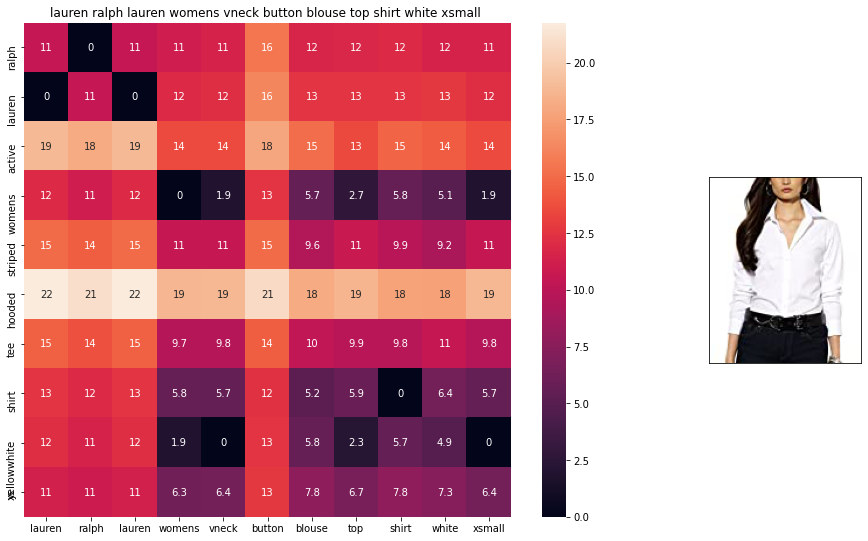

ASIN : B0713MCCFX
Brand : RALPH LAUREN
euclidean distance from input : 3.1532543


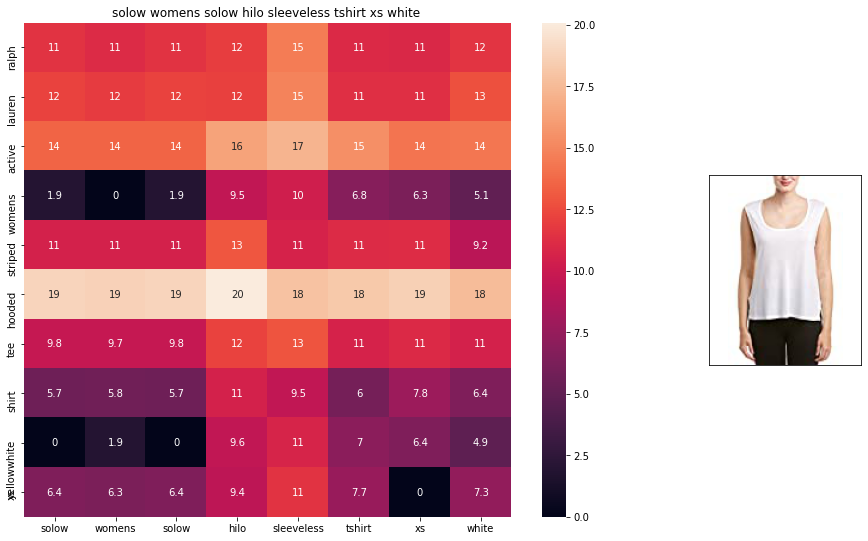

ASIN : B01M292SR6
Brand : SOLOW
euclidean distance from input : 3.1820793


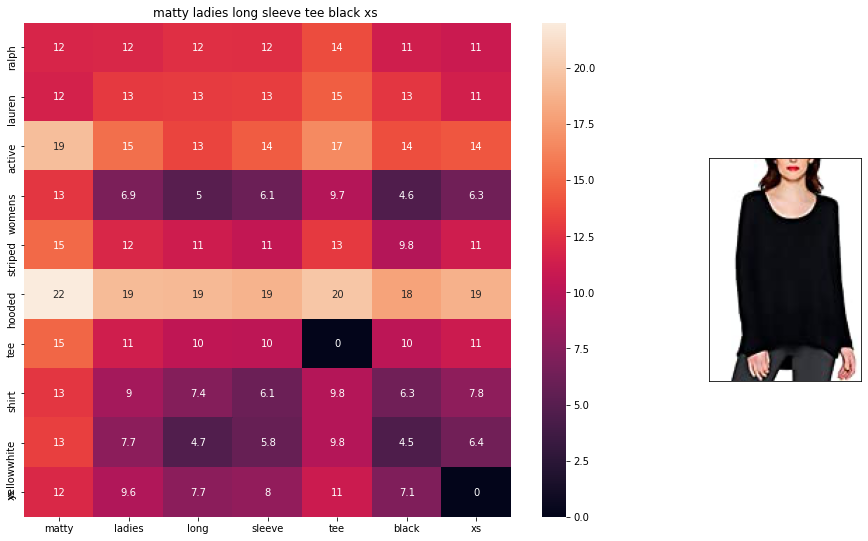

ASIN : B01N4714YM
Brand : Matty M
euclidean distance from input : 3.2157245


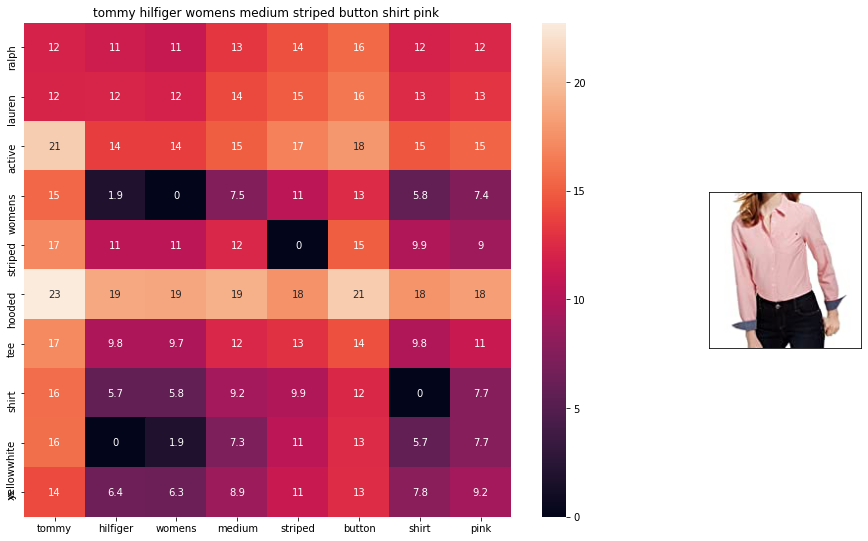

ASIN : B014EIIFZU
Brand : Tommy Hilfiger
euclidean distance from input : 3.2291455


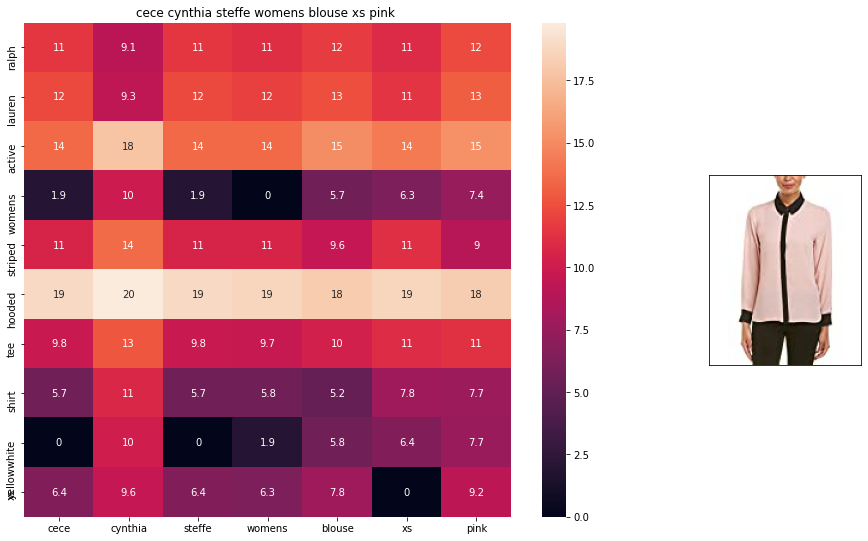

ASIN : B0753KHPD2
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 3.2485037


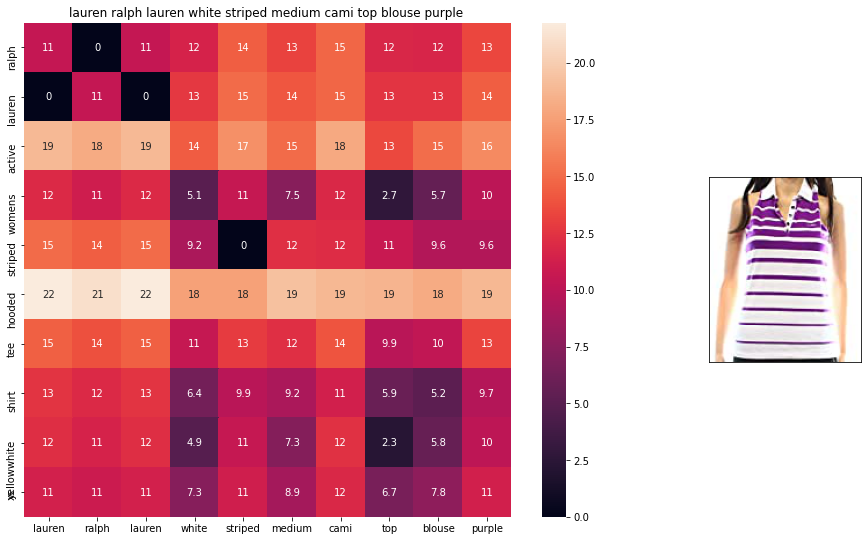

ASIN : B071GNRN41
Brand : Lauren by Ralph Lauren
euclidean distance from input : 3.2486684


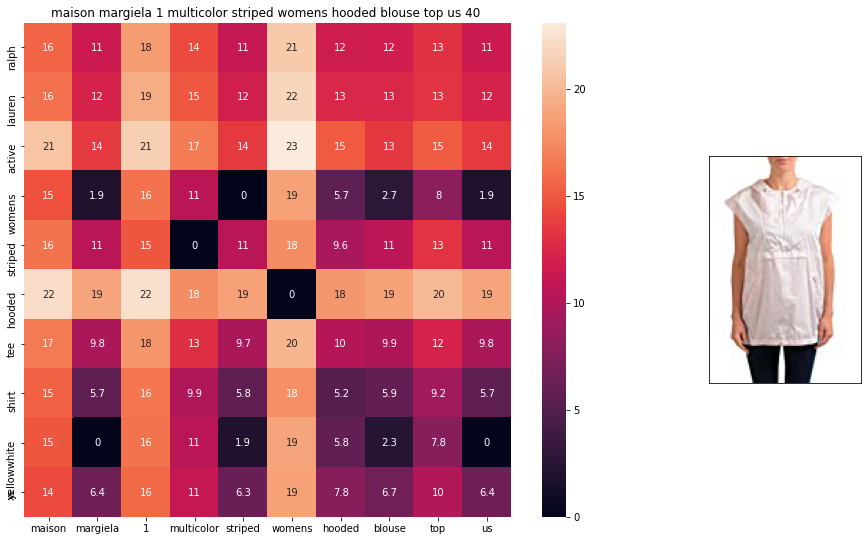

ASIN : B074G4CHN5
Brand : Maison Margiela
euclidean distance from input : 3.2755349


In [48]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12500, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

<b>Observations</b>: 
* BOW,IDF,TFIDF models were able to capture shirts with brand name and size well.
* Word-to-vec model is able to capture hooded shirts well unlike BOW and tfidf, idf

### [9.6] Weighted similarity using brand and color.

In [48]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [49]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in last 25 * 10:15 grids we display image

    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [50]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)


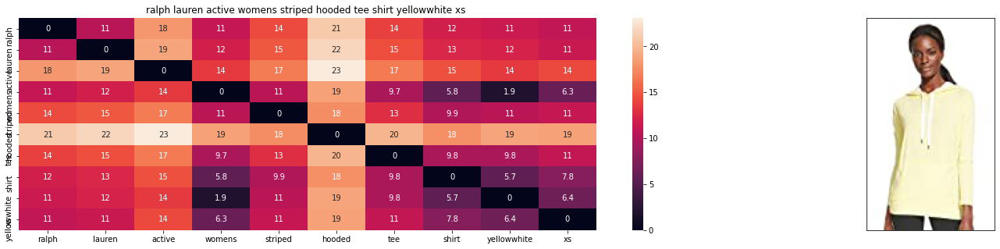

ASIN : B01JME4H6W
Brand : Ralph Lauren Active
euclidean distance from input : 0.0


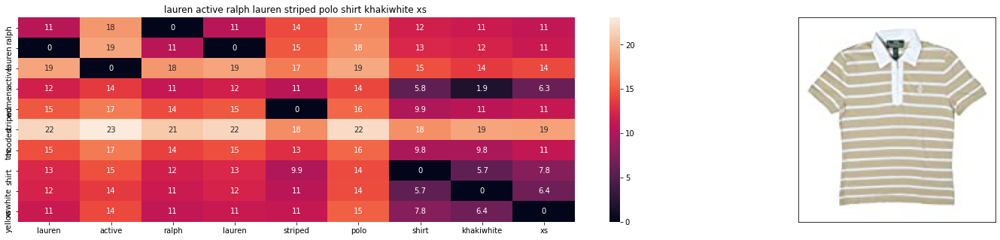

ASIN : B00ILGK6H2
Brand : Ralph Lauren Active
euclidean distance from input : 2.1476529123205808


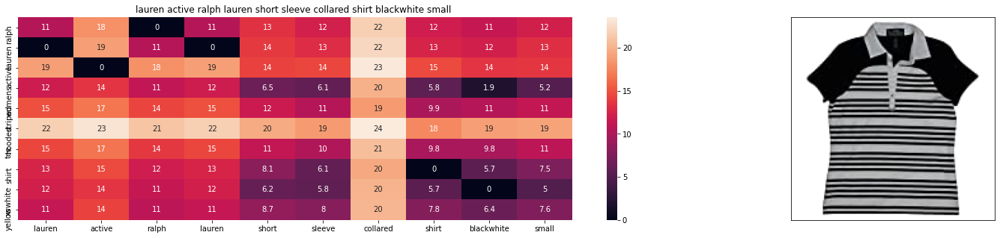

ASIN : B00HSX5ZAW
Brand : Ralph Lauren Active
euclidean distance from input : 2.2343664171118407


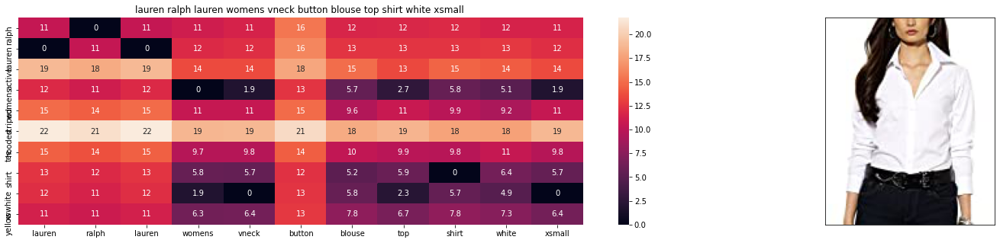

ASIN : B0713MCCFX
Brand : RALPH LAUREN
euclidean distance from input : 2.2837339403051997


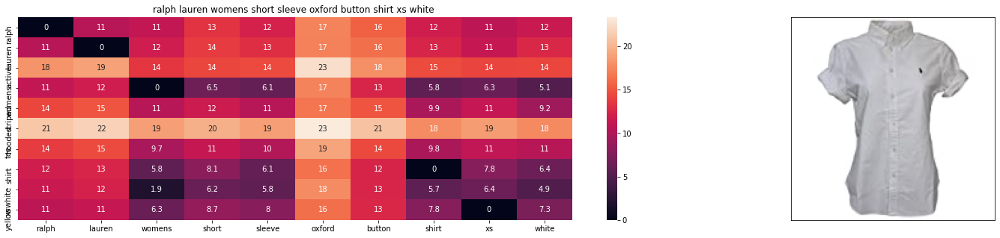

ASIN : B01FRIMR5U
Brand : RALPH LAUREN
euclidean distance from input : 2.372298050107446


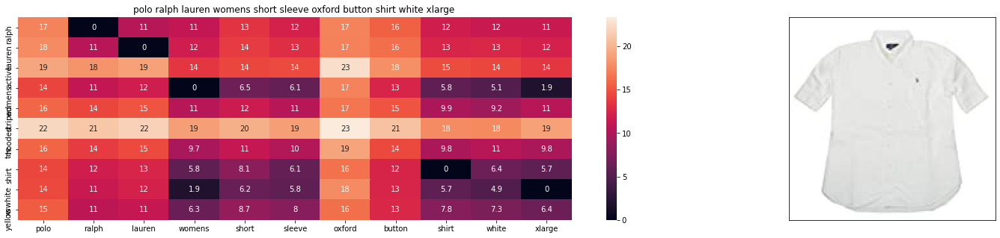

ASIN : B01DKUKFR4
Brand : RALPH LAUREN
euclidean distance from input : 2.3738574983496337


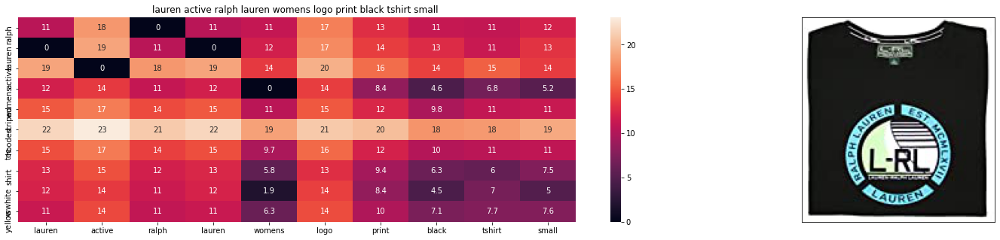

ASIN : B01E1SZIGM
Brand : Ralph Lauren Active
euclidean distance from input : 2.5163507974611963


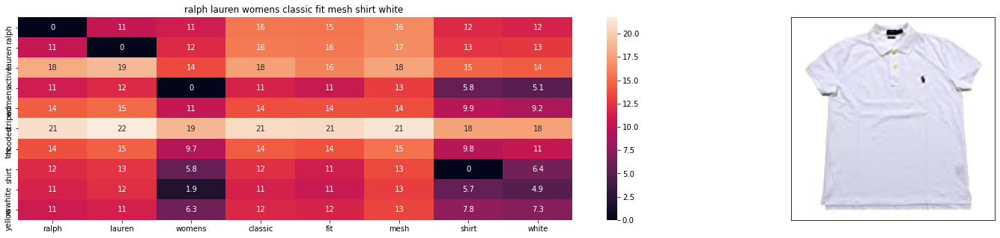

ASIN : B01KIXF87S
Brand : RALPH LAUREN
euclidean distance from input : 2.526565742673364


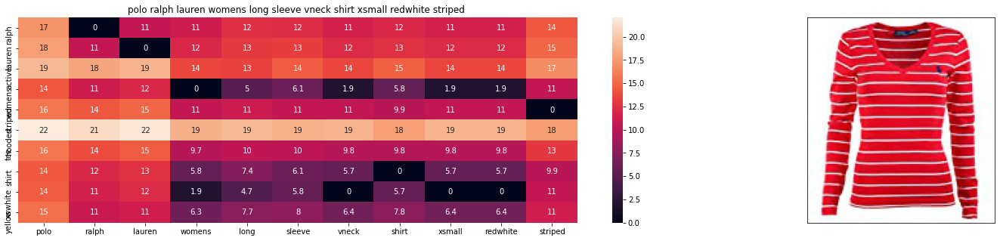

ASIN : B01MRL7J8F
Brand : Polo Ralph Lauren
euclidean distance from input : 2.5449358060716722


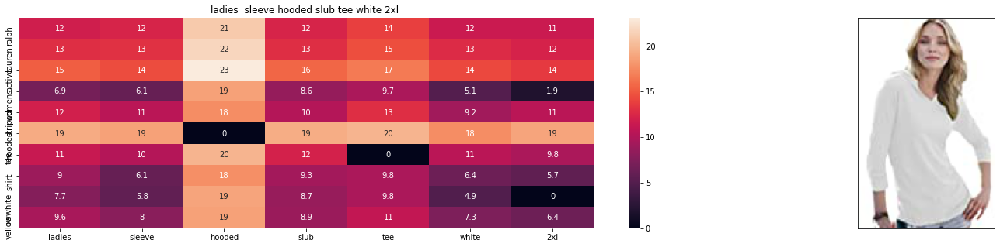

ASIN : B00CO8F6XW
Brand : J. America
euclidean distance from input : 2.614196975505266


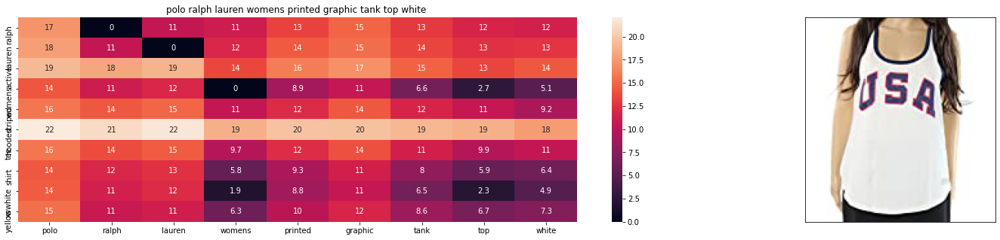

ASIN : B01NAP3SFK
Brand : Polo Ralph Lauren
euclidean distance from input : 2.615035108374282


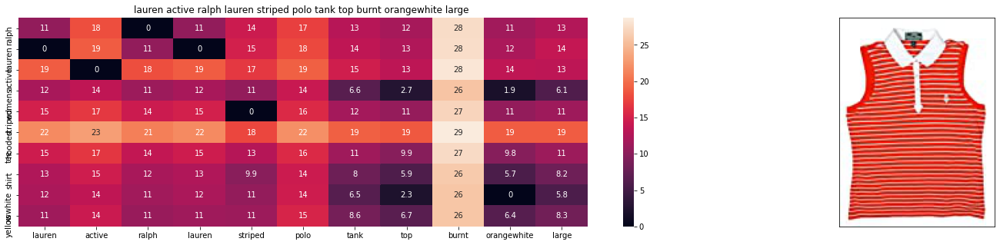

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 2.6280357873903957


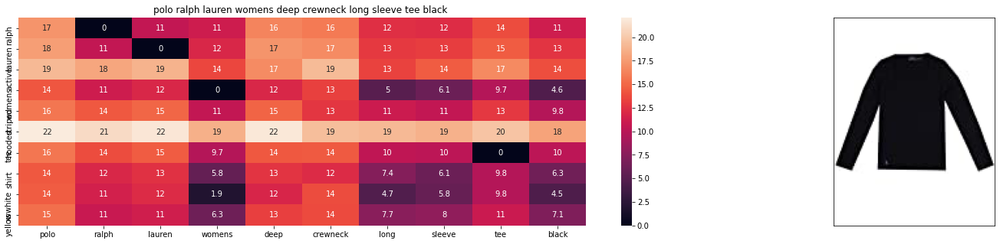

ASIN : B06X9ZVRV1
Brand : RALPH LAUREN
euclidean distance from input : 2.6555479049682615


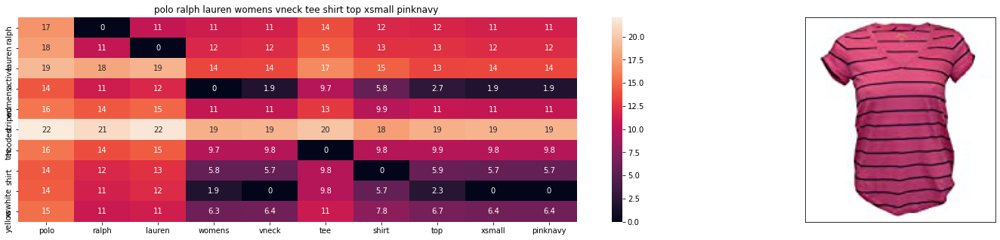

ASIN : B01ETUBK3W
Brand : RALPH LAUREN
euclidean distance from input : 2.6744027212022874


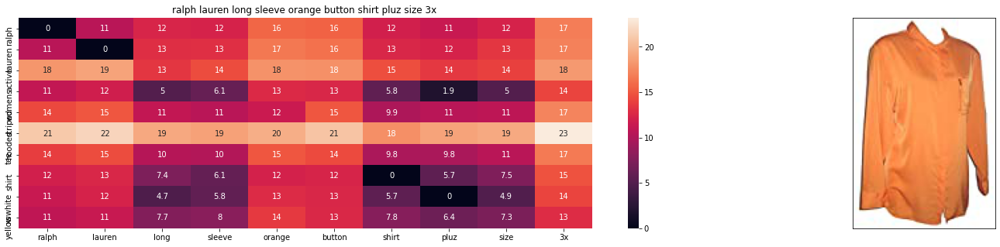

ASIN : B00IMMN726
Brand : RALPH LAUREN
euclidean distance from input : 2.677749824523926


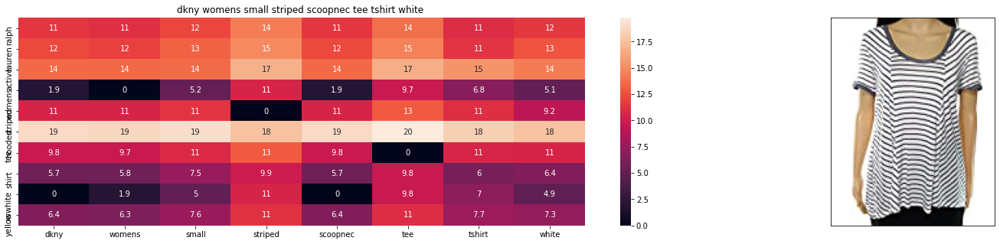

ASIN : B0725PWQFW
Brand : DKNY
euclidean distance from input : 2.686597354686174


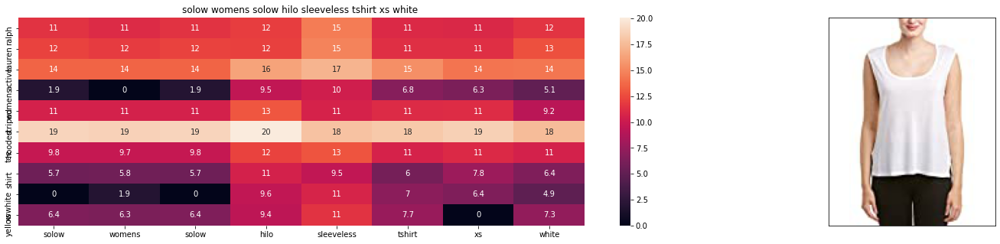

ASIN : B01M292SR6
Brand : SOLOW
euclidean distance from input : 2.7090736463426683


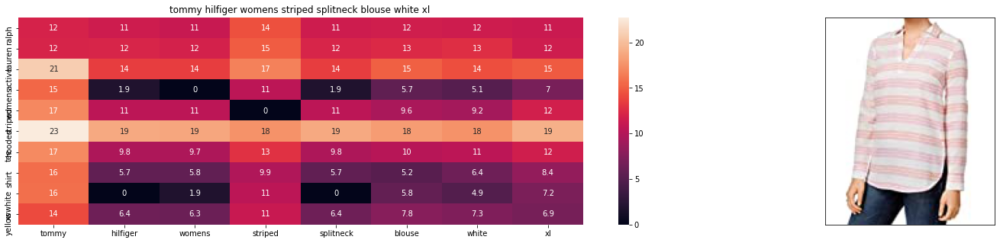

ASIN : B071VBTCXP
Brand : Tommy Hilfiger
euclidean distance from input : 2.7240975172656126


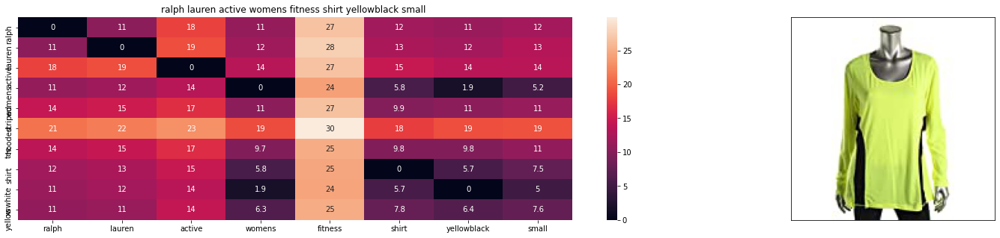

ASIN : B073WGPVWV
Brand : Ralph Lauren Active
euclidean distance from input : 2.7376338960547115


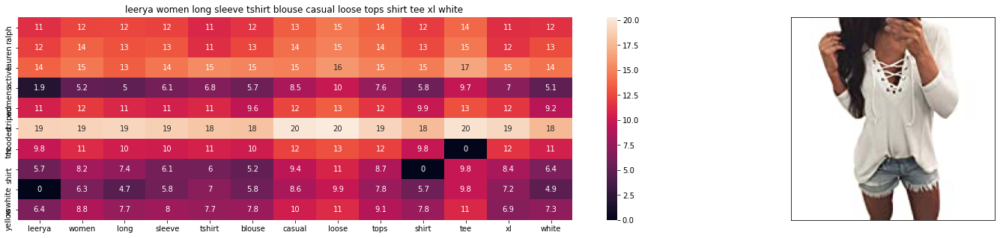

ASIN : B06XKNW8TM
Brand : LEERYA
euclidean distance from input : 2.7859026029466722


In [66]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12500, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

# [10.2] Keras and Tensorflow to extract features

In [62]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
from IPython.display import display, Image, SVG, Math, YouTubeVideo
import pandas as pd
import pickle

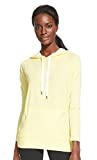

Product Title:  ralph lauren active womens striped hooded tee shirt yellowwhite xs 
Euclidean Distance from input image: 4.862804e-06
Amazon Url: www.amzon.com/dp/B01JME4H6W


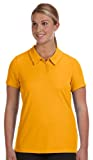

Product Title:  alo ladies junior fit performance mesh polo shirt w1709 large sport athletic gold 
Euclidean Distance from input image: 41.656384
Amazon Url: www.amzon.com/dp/B00PH3DJC6


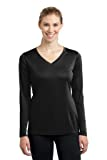

Product Title:  sporttek ladies long sleeve vneck competitor teexs black lst353ls 
Euclidean Distance from input image: 41.85273
Amazon Url: www.amzon.com/dp/B00J9UIK0O


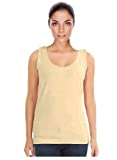

Product Title:  sugarlips womens relaxed fit seamless ribbed tank skin nude 
Euclidean Distance from input image: 42.043793
Amazon Url: www.amzon.com/dp/B00IJHSY54


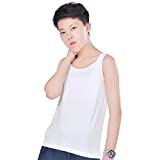

Product Title:  white lesbian super flat chest builtin elastic band binder slim fit tank tops xl 
Euclidean Distance from input image: 42.374218
Amazon Url: www.amzon.com/dp/B00NBGYAH4


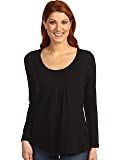

Product Title:  miraclebody womens jersey slimming tunic top black 
Euclidean Distance from input image: 42.843918
Amazon Url: www.amzon.com/dp/B0059GPDDE


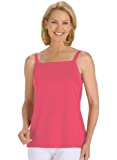

Product Title:  100 cotton camisole 4pack size extra large 3x 
Euclidean Distance from input image: 43.36531
Amazon Url: www.amzon.com/dp/B01B9RBRVS


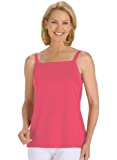

Product Title:  100 cotton camisole 4pack assorted size extra large 3x 
Euclidean Distance from input image: 43.36531
Amazon Url: www.amzon.com/dp/B01B9REAHQ


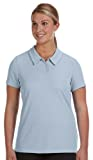

Product Title:  alo sport womens 3button mesh polo shirt sport crlna blue medium 
Euclidean Distance from input image: 43.60738
Amazon Url: www.amzon.com/dp/B00IM7XQ40


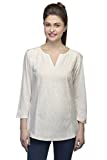

Product Title:  one femme womens solid cotton embroidered top xlarge white 001 
Euclidean Distance from input image: 43.652073
Amazon Url: www.amzon.com/dp/B01DLSOL1G


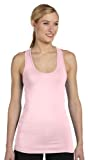

Product Title:  alo sport ladies bamboo racerback tank  pinkwhite  xs 
Euclidean Distance from input image: 43.812096
Amazon Url: www.amzon.com/dp/B004J8LKP8


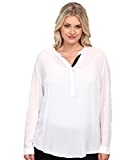

Product Title:  bb dakota womens plus size tereza top optic white 2x 
Euclidean Distance from input image: 44.02845
Amazon Url: www.amzon.com/dp/B00JG6EBEA


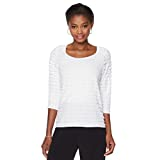

Product Title:  slinky 34slv ruffle scoopneck tee 532020 white l 
Euclidean Distance from input image: 44.035717
Amazon Url: www.amzon.com/dp/B0759W1F8F


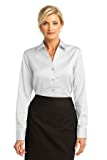

Product Title:  red house ladies french cuff noniron pinpoint oxford white xs 
Euclidean Distance from input image: 44.181805
Amazon Url: www.amzon.com/dp/B0090A7JX2


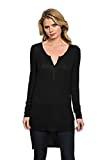

Product Title:  feel piece womens charlotte ribbed hi lo knit tunic top sz xss black 270075e 
Euclidean Distance from input image: 44.194263
Amazon Url: www.amzon.com/dp/B074TZTTP1


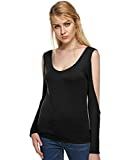

Product Title:  milkuu womens long sleeve cold shoulder shirts cross backless party top black 
Euclidean Distance from input image: 44.239902
Amazon Url: www.amzon.com/dp/B01I2WW6PE


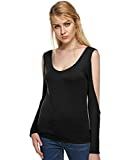

Product Title:  milkuu womens long sleeve cold shoulder shirts party top black 
Euclidean Distance from input image: 44.239902
Amazon Url: www.amzon.com/dp/B01I2WW7NK


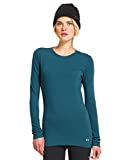

Product Title:  women39s ua coldgear174 infrared crew 
Euclidean Distance from input image: 44.285942
Amazon Url: www.amzon.com/dp/B00GOAMWLU


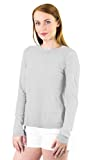

Product Title:  cloth  stone split back washed tee medium stone 
Euclidean Distance from input image: 44.40766
Amazon Url: www.amzon.com/dp/B06XTBW9MQ


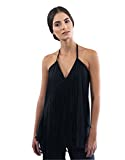

Product Title:  guayabita womens alba black blouse 
Euclidean Distance from input image: 44.513775
Amazon Url: www.amzon.com/dp/B01JM4ZO3M


In [2]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12500, 20)


<b>Observations</b> 
* Using CNN architecture vgg-16 , we used image as our input to produce similar products,we see that we are able to capture
similar shirts well .We can see that we are able to capture long-sleeves, plain colors and yellow colored products well.

### Assignment 
---- > let's use all the features text,brand,color,image ,give weights to all the features 
 calculate the euclidean distance

In [68]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
color = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(color)

vg16_features = np.load('16k_data_cnn_features.npy')

extra_features = hstack((w2v_title_weight,brand_features, color_features,vg16_features)).tocsr()

In [89]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], color[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], color[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,3), annot=True)
    
    # np.concatenate((sentance2.split(),[sentance2.split()[0]]))
    # np.concatenate((sentance1.split(),[sentance1.split()[0]]))
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)
    
    # set title as recommended apparels title
    ax1.set_title(sentance2)
    #print(len)
    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()
    

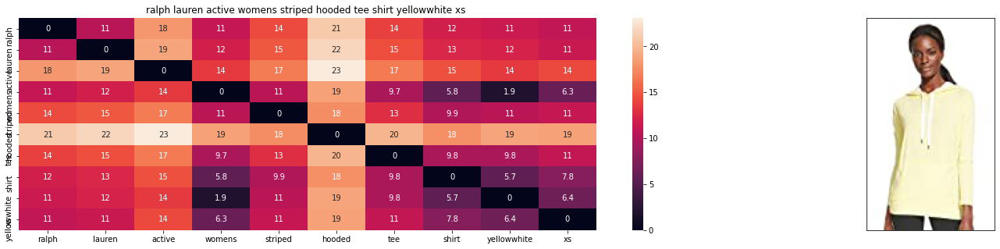

ASIN : B01JME4H6W
Brand : Ralph Lauren Active
euclidean distance from input : 0.0


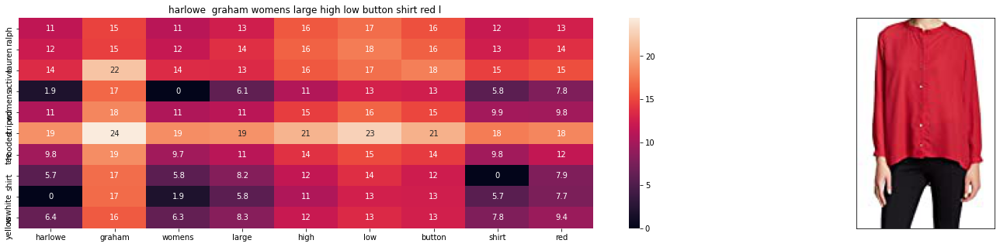

ASIN : B074T32Q46
Brand : Harlowe & Graham
euclidean distance from input : 1.802


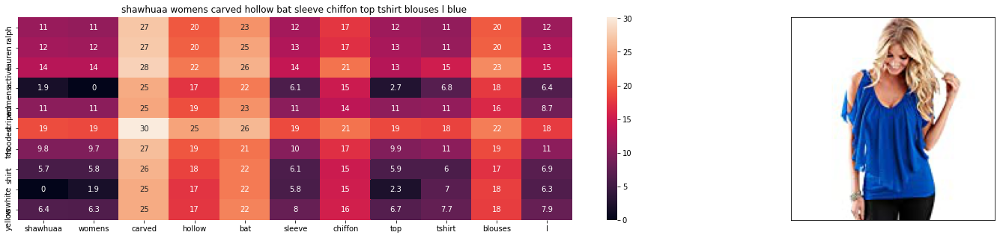

ASIN : B01H5L3CNI
Brand : Shawhuaa
euclidean distance from input : 1.86


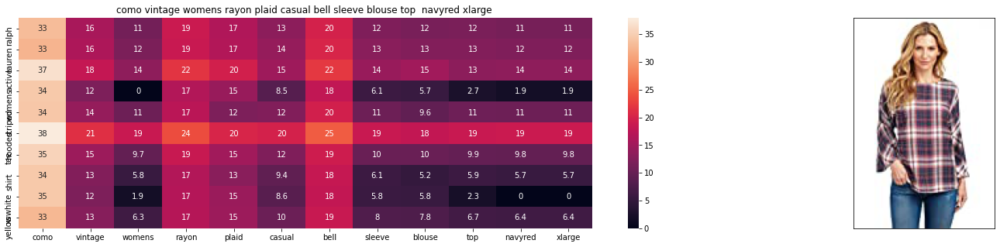

ASIN : B074TM1HJB
Brand : Como vintage
euclidean distance from input : 1.93


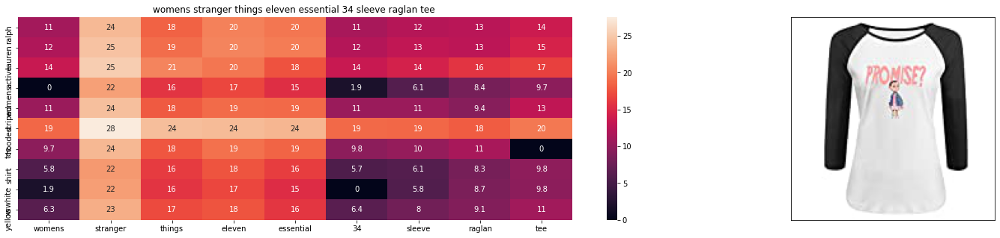

ASIN : B01LVWWXY2
Brand : JOWO88
euclidean distance from input : 1.943


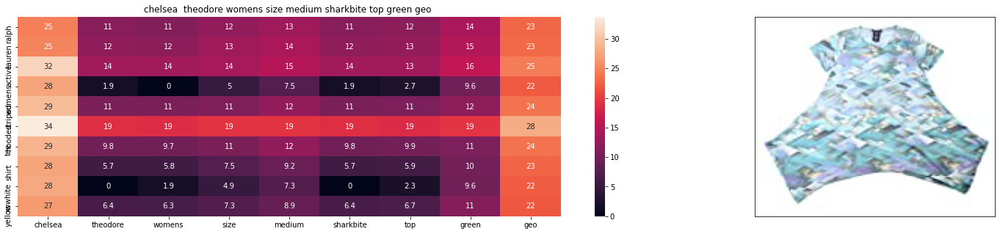

ASIN : B0759NHC93
Brand : Chelsea & Theodore
euclidean distance from input : 2.012


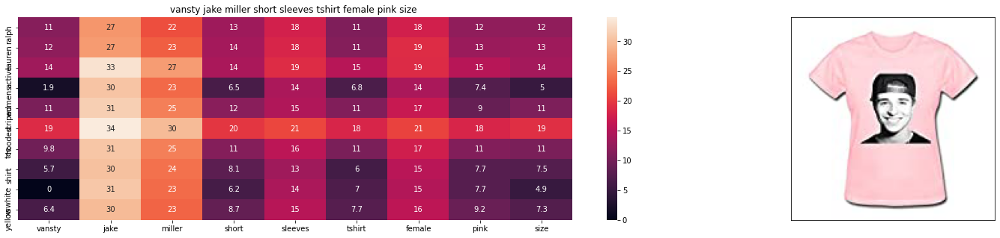

ASIN : B01BR1Q4PU
Brand : Vansty
euclidean distance from input : 2.02


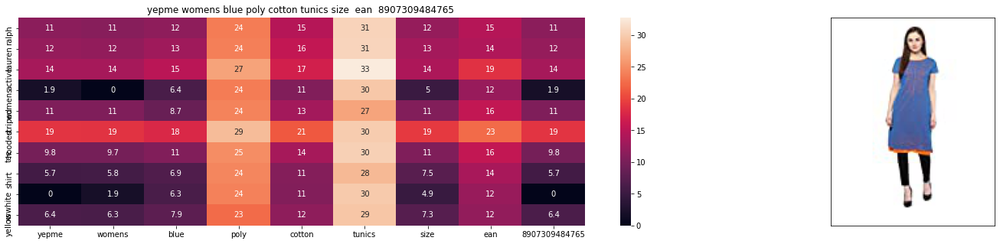

ASIN : B01M12O3WS
Brand : Yepme
euclidean distance from input : 2.077


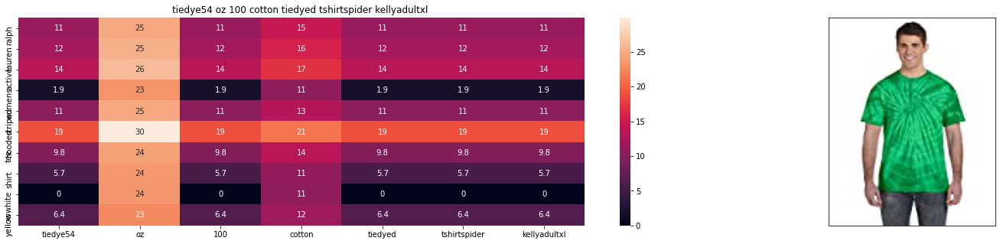

ASIN : B003JE7JZS
Brand : tie dye
euclidean distance from input : 2.12


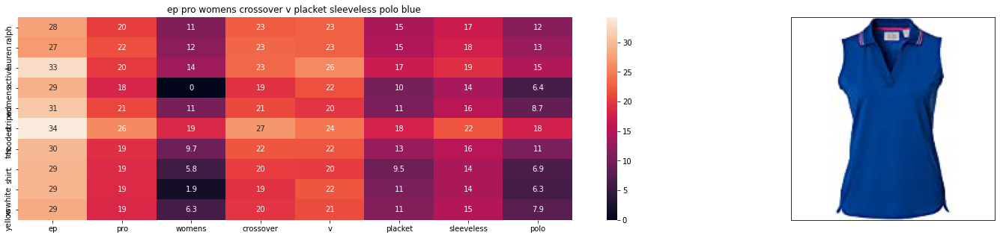

ASIN : B06ZZMXP8K
Brand : EP Pro
euclidean distance from input : 2.238


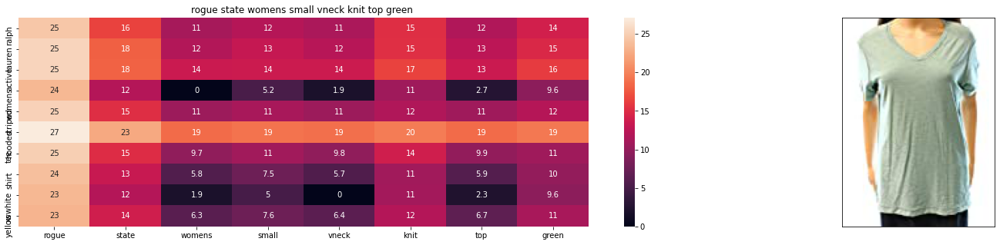

ASIN : B01MV37DJE
Brand : Rogue State
euclidean distance from input : 18.609


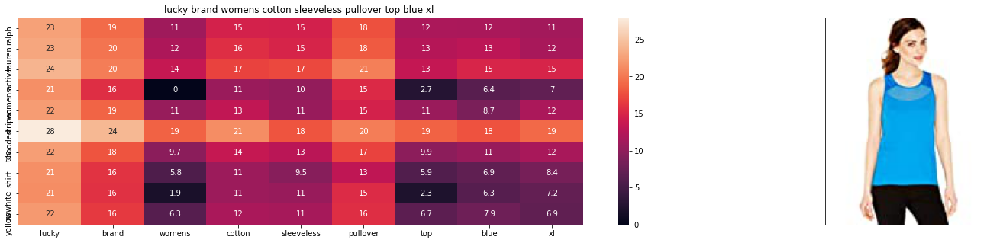

ASIN : B01DAGTXS0
Brand : LuckyBrand
euclidean distance from input : 18.687


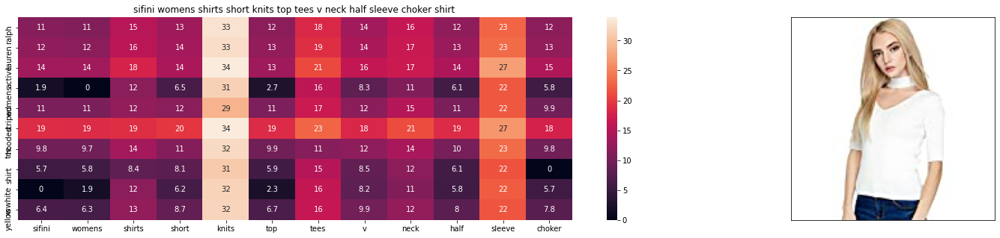

ASIN : B01MY1Z5SK
Brand : SIFINI
euclidean distance from input : 19.475


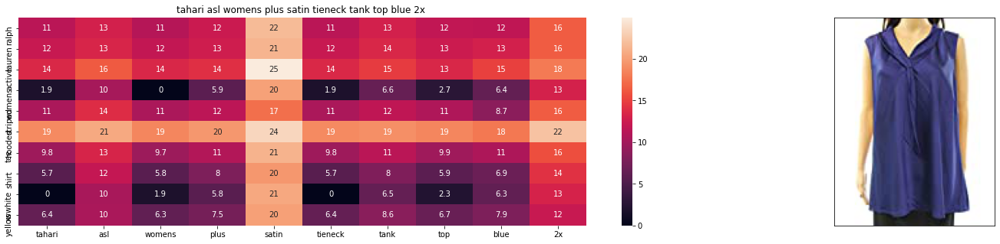

ASIN : B06WLMWCS7
Brand : Tahari by Arthur S. Levine
euclidean distance from input : 19.616


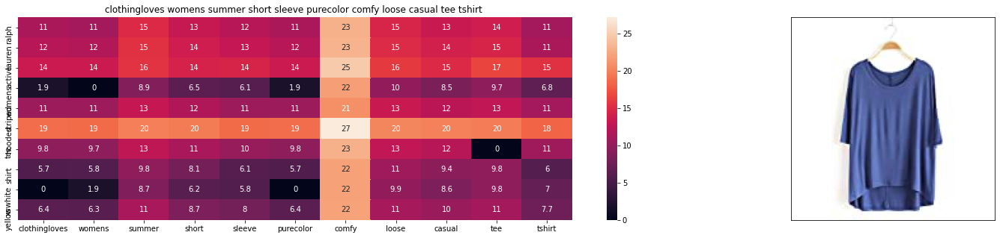

ASIN : B0746G8DGZ
Brand : ClothingLoves
euclidean distance from input : 19.814


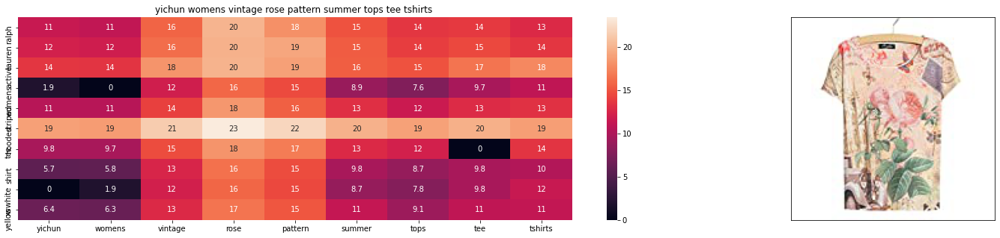

ASIN : B010NN9SZG
Brand : YICHUN
euclidean distance from input : 19.902


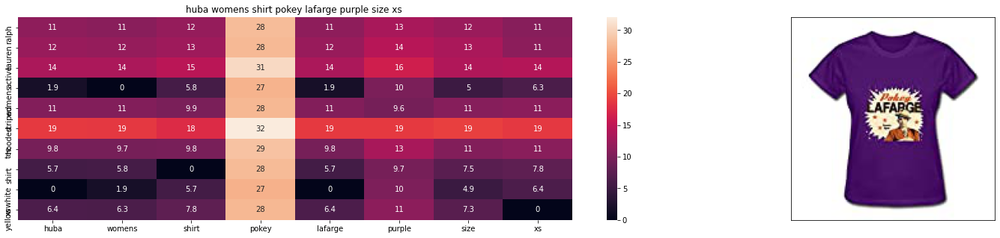

ASIN : B017X00EDW
Brand : HUBA Design
euclidean distance from input : 19.95


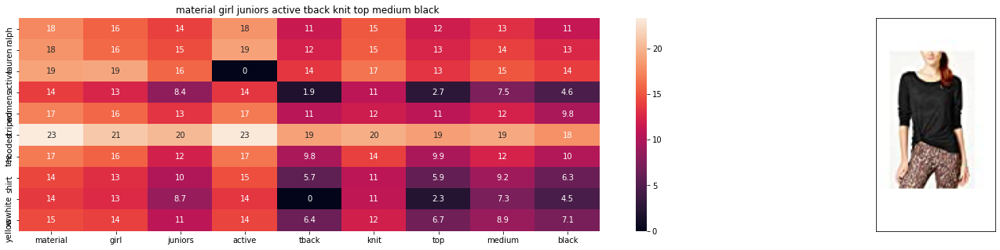

ASIN : B06XKZL1QG
Brand : Material Girl
euclidean distance from input : 20.068


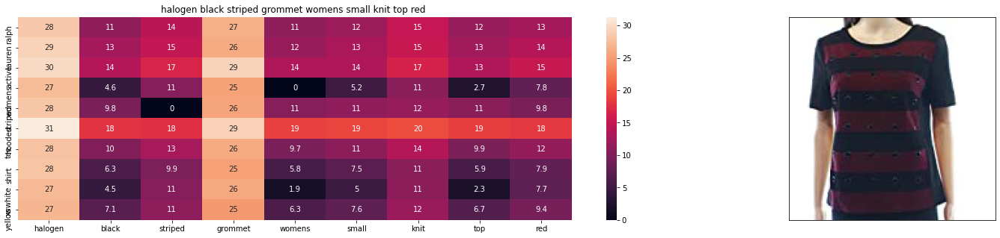

ASIN : B0711YCRGK
Brand : Halogen
euclidean distance from input : 20.11


In [99]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    brand_dist = pairwise_distances(brand_features,brand_features[doc_id])
    vg16_dist = pairwise_distances(vg16_features,vg16_features[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * color_dist + w3 * brand_dist + w4 * vg16_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
         #if data['asin'].loc[df_indices[i]]!='B00PVS29H8' :
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]],
        data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', round(pdists[i],3))
        print('='*125)
idf_w2v_brand(12500, 10, 5,5,15, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

Observations :
* We have given more weight to Text feature(10) and Image(15), we can see that our model is able to predict shirts with long sleeves and plain colors well.